In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime
import random

# About the Dataset:

<b>Information about the data: </b>

<b> About this dataset: </b> <br><br>
- Data in these reference tables have been calculated using Textkernel online job adverts data. They show volumes of online job adverts by different geographies and different occupations detail (see below for definitions).

- These statistics should be treated as official statistics in development (previously known as experimental statistics), as they are still subject to testing the ability to meet user needs and may be modified in the future. More information on official statistics in development can be found here: https://www.ons.gov.uk/methodology/methodologytopicsandstatisticalconcepts/guidetoofficialstatisticsindevelopment

- The data tables in this spreadsheet were published on the 15th March 2024.

<br><b>
Information to consider: </b>
<b> New Adverts: </b> <br><br>
New adverts represent the total number of adverts that have gone online in the month. This metric is calculated by counting the number of adverts that appear for the first time across the calendar month. 

<b> Textkernel Data: </b> <br><br>
Textkernel data is collected using comprehensive web-scraping software which downloads job advert information from approximately 90,000 job boards and recruitment pages. The scraped data includes job titles, descriptions, posting dates and expiration dates. Additionally, Textkernel provide variables which are derived from the scraped data using data science and natural language processing methods. These describe location, salary, seniority, skill requirements, home/office working, and more. Textkernel perform some proprietary data cleaning to identify duplicate job adverts, which ONS have removed in this release. Duplication can occur when the same job is posted on multiple job boards, or when multiple recruiters advertise the job at the same time.

<b> SOC 2020: </b> <br><br>
To evaluate performance of the SOC allocation algorithm, we assessed its accuracy on a manually labelled set of adverts. We found that algorithm accuracy progressively decreased at the more granular levels of the SOC hierarchy, meaning that accuracy was the highest at the level of SOC major groups (1-digit SOC). Hence, the tables shown in this output are less granular for smaller geographies (2-digit) and the lowest level  (4-digit) is only shown for country-level results.

<b> Units, rounding and suppression: </b> <br><br>
Counts have been rounded to the nearest 5. Due to this rounding, aggregations across different tables may not sum to the same value. Note, this is particularly relevant where there are many granular categories of job adverts at one level of geography and occupation detail that would have been rounded to 0, as when aggregated, the sum of these supressed values will be significant. Counts that round to 0 have been replaced with [x].

<b> Quality of Data: </b> <br><br>
Due to the experimental nature of online job advert data, there are some quality aspects to be aware of when using the data. In some cases, there is no clear method to rectify these issues, so they are reported here as a caveat.

Missing information:
ONS has received incorrect delivery of expiration dates during some periods of the timeseries. Textkernel informed us that there was an issue with the data scraping algorithms in 2021. The data scraping software, at that time, reported the expiration of many adverts that were, in fact, still live. Because of this, the data would have showed a large drop-off in volumes, followed by a large spike in the last quarter of 2021, as adverts came back online. ONS has rectified this by imputing new expiration dates throughout the erroneous period, which has had the desired effect of smoothing the timeseries. Expiration dates were imputed for the periods: 1st April 2020 - 7th December 2021. This imputation mostly affects the snapshot metric.Textkernel has updated their methodologies and taxonomies throughout the timeseries back to 2017. This results in changes to classification of locations, which can produce some step-changes in the data.

Geographic allocation:
A substantial proportion of online job adverts have a limited level of granularity regarding location. Textkernel’s default method when assigning adverts to local authority with limited location information was to assign to the centroid of the region. This was most prevalent in London, where Westminster reported much higher counts than the surrounding local authorities as it is the centroid of the region of London. For this release, we have grouped all local authorities of London into the same region. Note, there are also online job adverts that have not been assigned to a local authority district which are shown as 'Unknown', and so when they are mapped to country, region, mayoral combined authority, local skills improvement plan, and local enterprise partnership, those regions only contain adverts that were in a known local authority.

Duplicate adverts:
To remove duplicate advertisements for the same job from the dataset, Textkernel groups 'postings' into 'jobs'. A job advert can be live in the form of many postings, across different websites. ONS uses Textkernel's deduplication method and reports deduplicated counts. However, sometimes 'postings' are grouped together into the same 'job' while their advertising periods do not overlap. This means there is some period of time when the job is not actually being advertised on any website, before it again becomes live on another website. Considering that ONS' focus is on 'live' adverts, we have decided to consider all such separate instances of adverts as two distinct entries, if the period when the 'job' is not on any website is more than two days. This means there will be a new advert counted when its posting becomes live, following a previous posting for the same job that has expired more than two days previously. Similarly, the advert is only counted in the snapshot measure if it is during a period when it is on at least one website.

# USING TABLE 21 (SOC 2 - BY LSIP)

In [2]:
df_t21= pd.read_excel('Data/labourdemandbyoccupation.xlsx', sheet_name='Table 21', skiprows=4)
df_t21.head()

,Local Skills Improvement Plan,SOC 2 digit code,SOC 2 digit label,Jan-17,Feb-17,Mar-17,Apr-17,May-17,Jun-17,Jul-17,...,Aug-22,Sep-22,Oct-22,Nov-22,Dec-22,Jan-23,Feb-23,Mar-23,Apr-23,May-23
0,"Brighton and Hove, East Sussex, West Sussex",11,Corporate managers and directors,850,635,765,680,800,950,650,...,1155,1060,1205,1120,1020,1260,970,910,900,970
1,"Brighton and Hove, East Sussex, West Sussex",12,Other managers and proprietors,670,515,650,575,625,690,470,...,815,855,825,785,660,885,640,675,645,745
2,"Brighton and Hove, East Sussex, West Sussex",21,"Science, research, engineering and technology ...",1795,1430,1865,1825,1895,1850,1360,...,2245,1985,2435,2285,2230,2560,1920,1790,1510,1415
3,"Brighton and Hove, East Sussex, West Sussex",22,Health professionals,1220,1010,1430,1285,1505,1530,1260,...,2055,2035,2255,2280,2130,2655,2175,2175,2145,1970
4,"Brighton and Hove, East Sussex, West Sussex",23,Teaching and other educational professionals,675,520,640,505,585,635,355,...,650,1005,1230,1645,1275,1240,1155,1270,1210,1330


In [3]:
df_t21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 988 entries, 0 to 987
Data columns (total 80 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Local Skills Improvement Plan  988 non-null    object
 1   SOC 2 digit code               988 non-null    int64 
 2   SOC 2 digit label              988 non-null    object
 3   Jan-17                         988 non-null    object
 4   Feb-17                         988 non-null    object
 5   Mar-17                         988 non-null    object
 6   Apr-17                         988 non-null    object
 7   May-17                         988 non-null    object
 8   Jun-17                         988 non-null    object
 9   Jul-17                         988 non-null    object
 10  Aug-17                         988 non-null    object
 11  Sep-17                         988 non-null    object
 12  Oct-17                         988 non-null    object
 13  Nov-1

In [4]:
# Inspecting Quality of Categorical Variables:
t21_cat = []

for col in df_t21.iloc[:,:3].columns:
    print(col)
    print(df_t21[col].unique())
    print(df_t21[col].nunique())
    t21_cat.append(df_t21[col].nunique())
    print('-----------------------------------------------------------------------------')
    print('-----------------------------------------------------------------------------')


Local Skills Improvement Plan
['Brighton and Hove, East Sussex, West Sussex' 'Buckinghamshire'
 'Cambridgeshire and Peterborough' 'Cheshire and Warrington'
 'Cornwall and the Isles of Scilly' 'Cumbria'
 'Derbyshire and Nottinghamshire' 'Dorset'
 'Enterprise M3 LEP (including all of Surrey)'
 'Essex, SouthendonSea and Thurrock' 'Gloucestershire'
 'Greater Lincolnshire' 'Greater London' 'Greater Manchester'
 'Heart of the SouthWest' 'Hertfordshire' 'Hull and East Yorkshire'
 'Kent and Medway' 'Lancashire' 'Leicester and Leicestershire'
 'Liverpool City Region' 'Norfolk and Suffolk' 'North East'
 'North of Tyne' 'Oxfordshire' 'Solent' 'South East Midlands'
 'South Yorkshire' 'StokeonTrent and Staffordshire'
 'Swindon and Wiltshire' 'Tees Valley' 'Thames Valley Berkshire'
 'The Marches' 'West Midlands and Warwickshire'
 'West of England and North Somerset' 'West Yorkshire' 'Worcestershire'
 'York and North Yorkshire']
38
---------------------------------------------------------------------

In [5]:
t21_cat

[38, 26, 26]

In [6]:
assert t21_cat[1] == t21_cat[2] # SOC 4 = Occupations

In [7]:
# Checking nulls and [x] values:
df_t21.isnull().sum().sum()

0

In [8]:
df_t21['Jan-17'].value_counts()

10      22
5       18
15      11
[x]     11
95      11
        ..
3055     1
1760     1
1000     1
985      1
665      1
Name: Jan-17, Length: 347, dtype: int64

There exists some ['x']

In [9]:
df_t21.replace('[x]', 0, inplace=True)
df_t21.replace(np.NaN, 0, inplace=True)

# Asserting it works:
assert df_t21.isnull().sum().sum() == 0 # No nulls
assert ('x' in df_t21['Jan-17'].values) == False  # No [x] values

/tmp/ipykernel_140572/2319945698.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  assert ('x' in df_t21['Jan-17'].values) == False  # No [x] values


In [10]:
df_t21['Jan-17'].value_counts()

10      22
5       18
15      11
0       11
95      11
        ..
3055     1
1760     1
1000     1
985      1
665      1
Name: Jan-17, Length: 347, dtype: int64

In [11]:
df_t21.iloc[:, 3:] = df_t21.iloc[:, 3:].astype('int64', errors='raise')
df_t21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 988 entries, 0 to 987
Data columns (total 80 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Local Skills Improvement Plan  988 non-null    object
 1   SOC 2 digit code               988 non-null    int64 
 2   SOC 2 digit label              988 non-null    object
 3   Jan-17                         988 non-null    int64 
 4   Feb-17                         988 non-null    int64 
 5   Mar-17                         988 non-null    int64 
 6   Apr-17                         988 non-null    int64 
 7   May-17                         988 non-null    int64 
 8   Jun-17                         988 non-null    int64 
 9   Jul-17                         988 non-null    int64 
 10  Aug-17                         988 non-null    int64 
 11  Sep-17                         988 non-null    int64 
 12  Oct-17                         988 non-null    int64 
 13  Nov-1

## Resampling as a Time Series:

In [12]:
df_t21_ts = pd.melt(df_t21, id_vars=['Local Skills Improvement Plan', 'SOC 2 digit code', 'SOC 2 digit label'], var_name='Date', value_name='Data')
df_t21_ts['Date'] = pd.to_datetime(df_t21_ts['Date'], format='%b-%y', errors='raise')
df_t21_ts.head()

,Local Skills Improvement Plan,SOC 2 digit code,SOC 2 digit label,Date,Data
0,"Brighton and Hove, East Sussex, West Sussex",11,Corporate managers and directors,2017-01-01,850
1,"Brighton and Hove, East Sussex, West Sussex",12,Other managers and proprietors,2017-01-01,670
2,"Brighton and Hove, East Sussex, West Sussex",21,"Science, research, engineering and technology ...",2017-01-01,1795
3,"Brighton and Hove, East Sussex, West Sussex",22,Health professionals,2017-01-01,1220
4,"Brighton and Hove, East Sussex, West Sussex",23,Teaching and other educational professionals,2017-01-01,675


# USING TABLE 21 (SOC 2 - BY  LSIP)

In [13]:
df_t21_ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76076 entries, 0 to 76075
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Local Skills Improvement Plan  76076 non-null  object        
 1   SOC 2 digit code               76076 non-null  int64         
 2   SOC 2 digit label              76076 non-null  object        
 3   Date                           76076 non-null  datetime64[ns]
 4   Data                           76076 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(2)
memory usage: 2.9+ MB


In [14]:
df_t21_ts["Local Skills Improvement Plan"].value_counts()

Brighton and Hove, East Sussex, West Sussex    2002
StokeonTrent and Staffordshire                 2002
Norfolk and Suffolk                            2002
North East                                     2002
North of Tyne                                  2002
Oxfordshire                                    2002
Solent                                         2002
South East Midlands                            2002
South Yorkshire                                2002
Swindon and Wiltshire                          2002
Buckinghamshire                                2002
Tees Valley                                    2002
Thames Valley Berkshire                        2002
The Marches                                    2002
West Midlands and Warwickshire                 2002
West of England and North Somerset             2002
West Yorkshire                                 2002
Worcestershire                                 2002
Liverpool City Region                          2002
Leicester an

### Exploratory - New ADS per LSIP

In [15]:
groupcountry_df_t21_ts = df_t21_ts.groupby(['Date', 'Local Skills Improvement Plan']).sum().reset_index().drop(columns='SOC 2 digit code')
groupcountry_df_t21_ts.head()

,Date,Local Skills Improvement Plan,Data
0,2017-01-01,"Brighton and Hove, East Sussex, West Sussex",20010
1,2017-01-01,Buckinghamshire,7365
2,2017-01-01,Cambridgeshire and Peterborough,18920
3,2017-01-01,Cheshire and Warrington,15170
4,2017-01-01,Cornwall and the Isles of Scilly,3680


In [16]:
fig = px.line(groupcountry_df_t21_ts, x='Date', y='Data', color='Local Skills Improvement Plan', title='Jobs Offer (New ADS) by LSIP')

fig.update_layout(height=600, width=1600)
fig.show()

### Time Series Decomposition: LSIP


Doing some Time Series decomposition to understand the Time Series: Which laggings are important? Is it Stationary? 

In [17]:
groupcountry_df_t21_ts_c = groupcountry_df_t21_ts.copy()

Local Skills Improvement Plan: Brighton and Hove, East Sussex, West Sussex
----------------------------------------------------------
Additive Decomposition


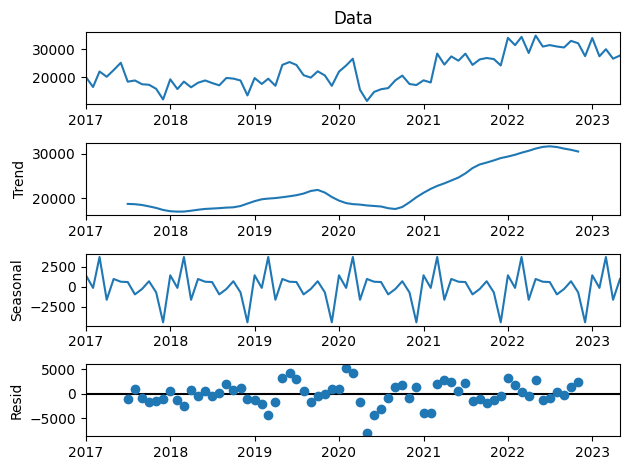

Multiplicative Decomposition


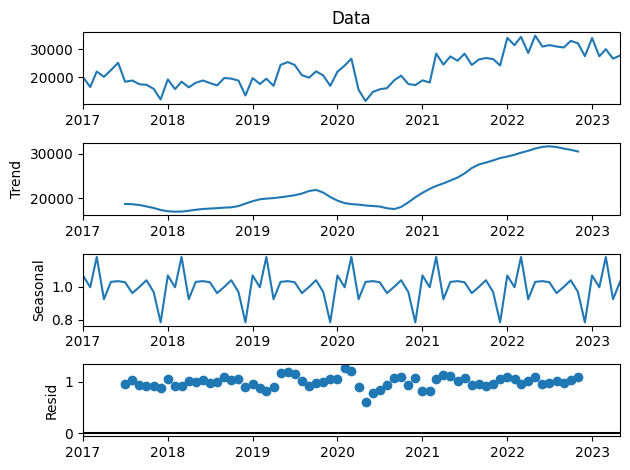

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



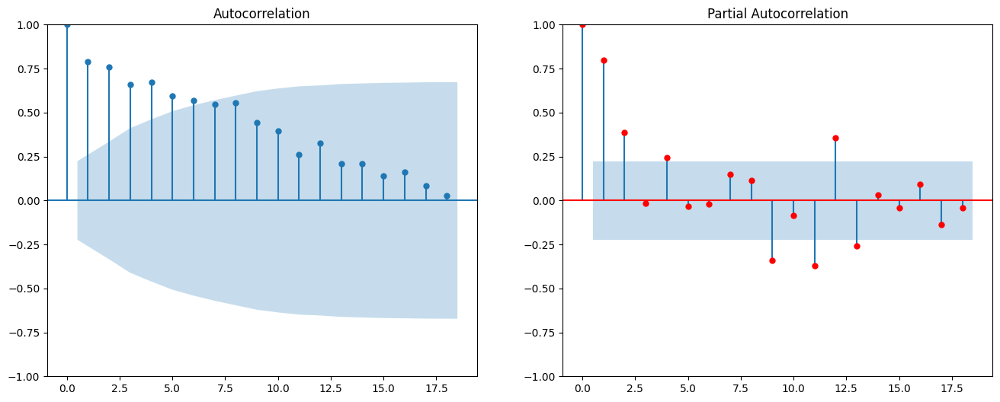

Local Skills Improvement Plan: Buckinghamshire
----------------------------------------------------------
Additive Decomposition


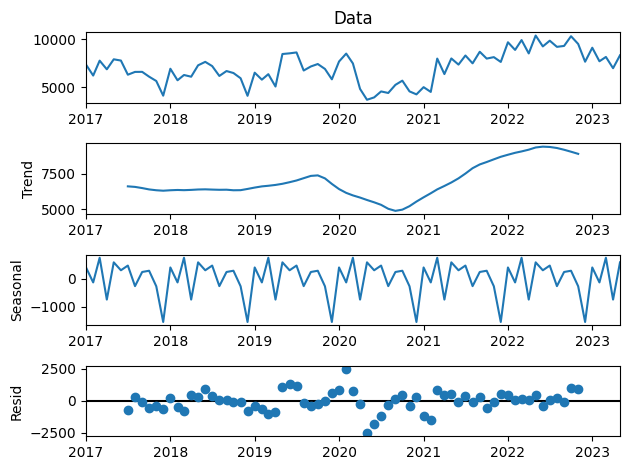

Multiplicative Decomposition


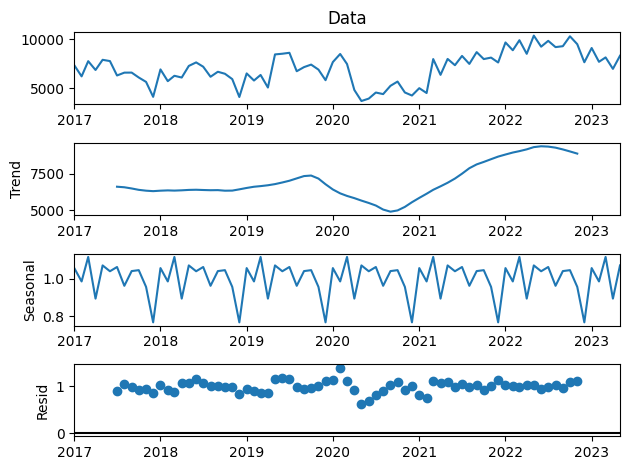

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



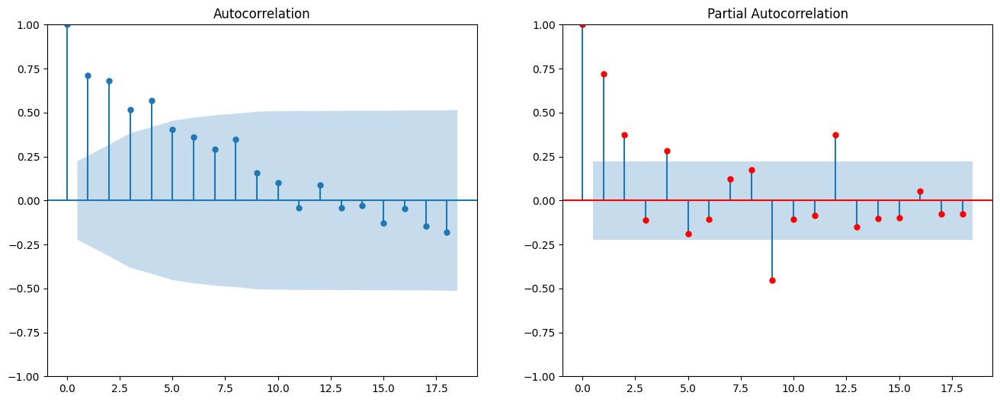

Local Skills Improvement Plan: Cambridgeshire and Peterborough
----------------------------------------------------------
Additive Decomposition


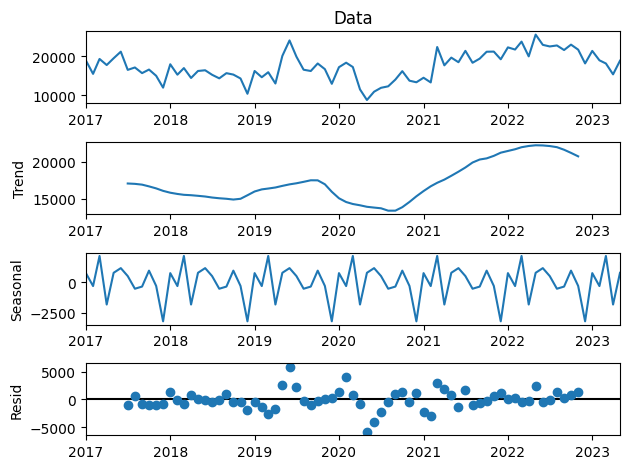

Multiplicative Decomposition


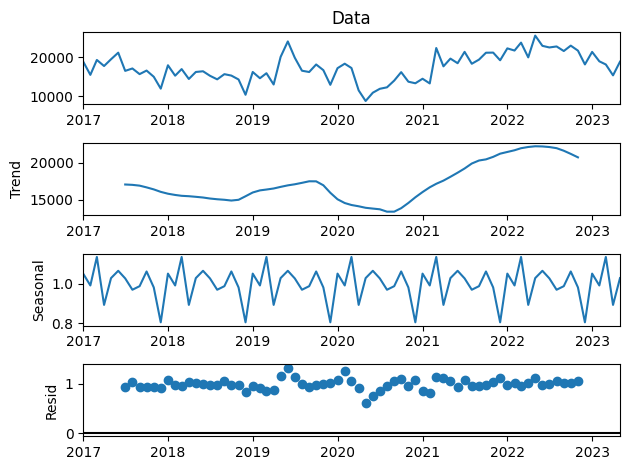

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



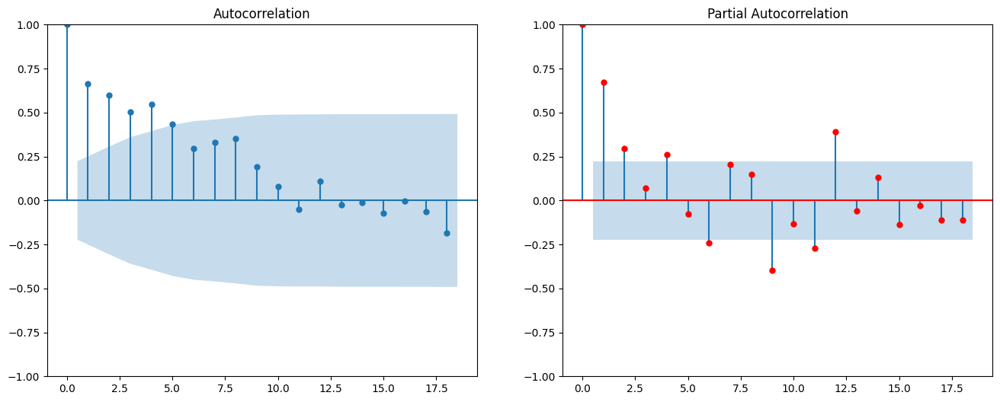

Local Skills Improvement Plan: Cheshire and Warrington
----------------------------------------------------------
Additive Decomposition


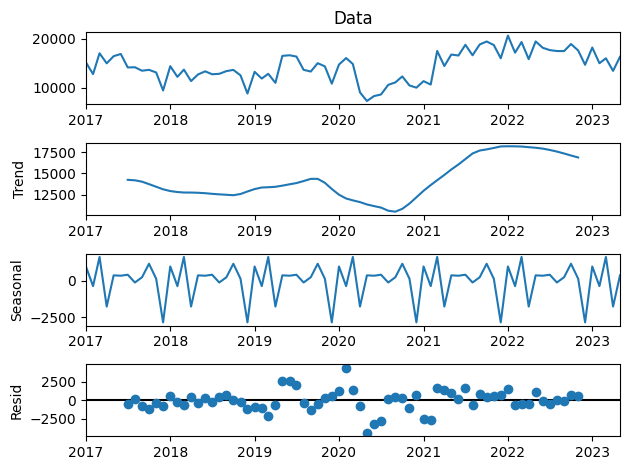

Multiplicative Decomposition


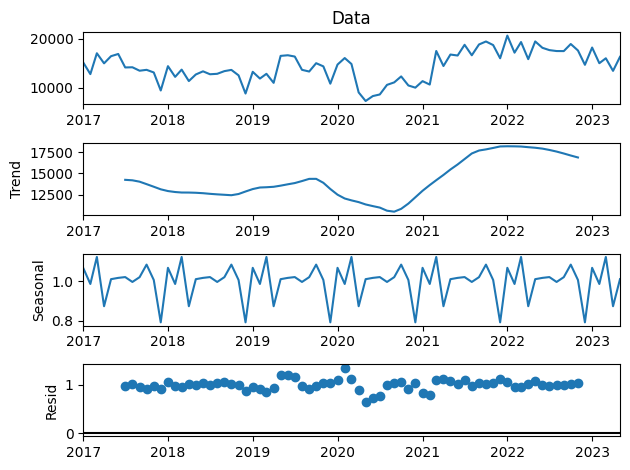

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



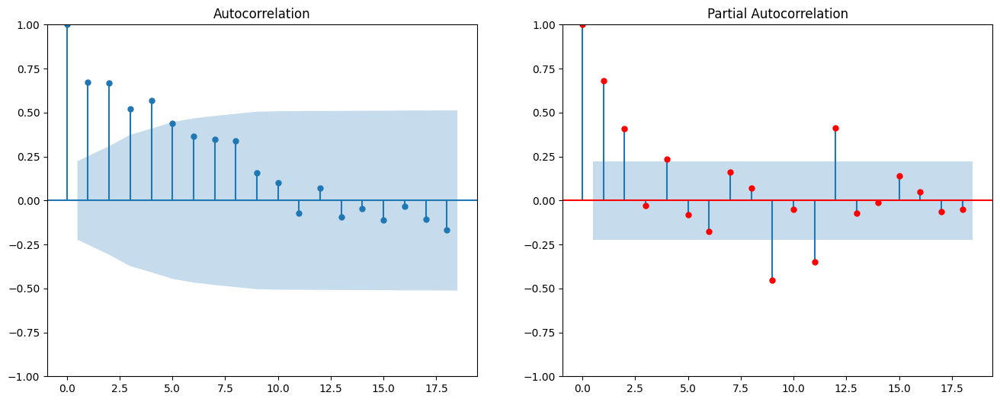

Local Skills Improvement Plan: Cornwall and the Isles of Scilly
----------------------------------------------------------
Additive Decomposition


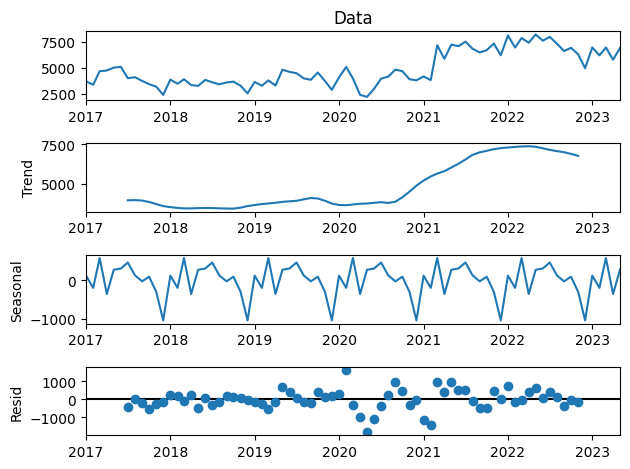

Multiplicative Decomposition


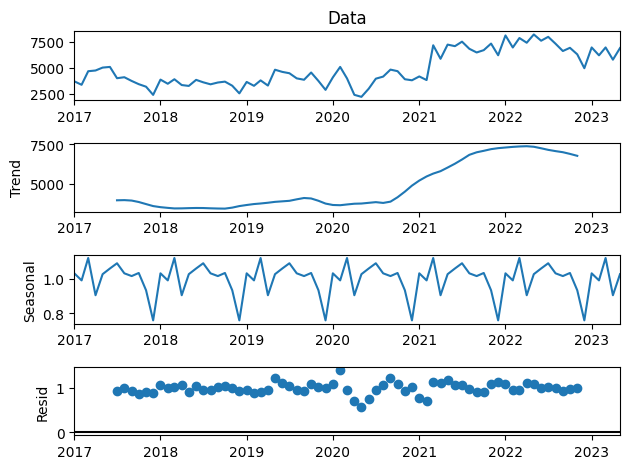

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



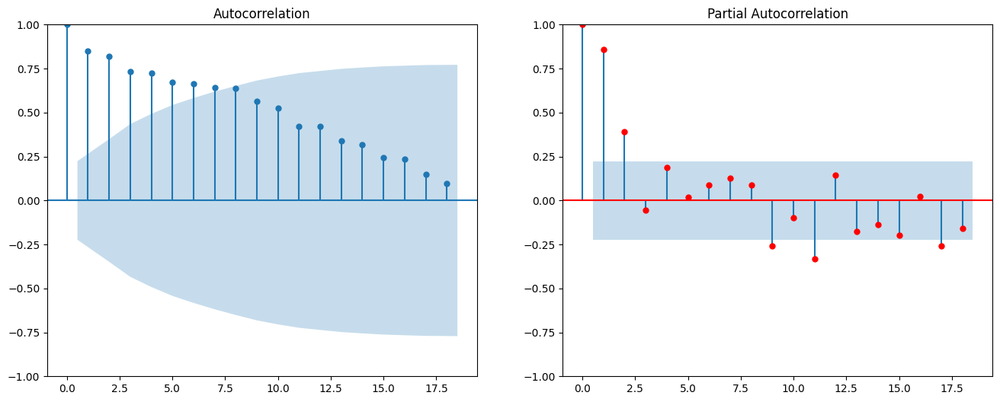

Local Skills Improvement Plan: Cumbria
----------------------------------------------------------
Additive Decomposition


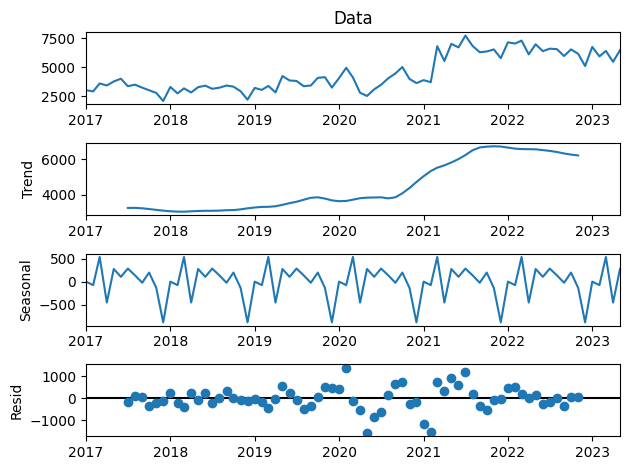

Multiplicative Decomposition


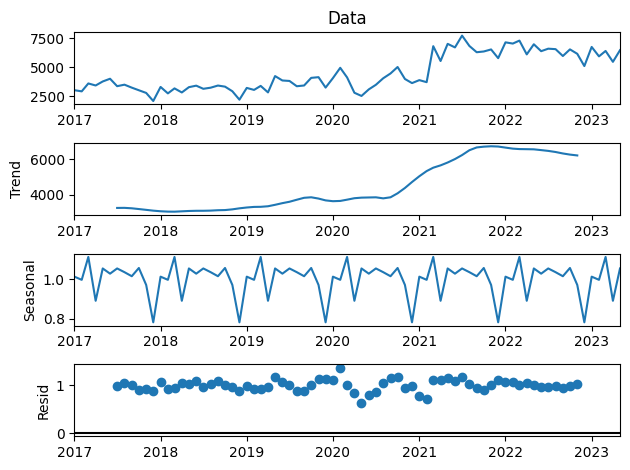

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



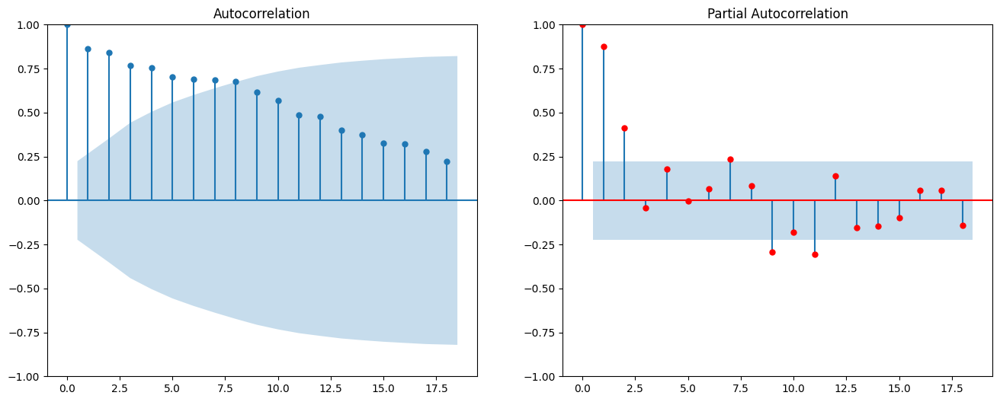

Local Skills Improvement Plan: Derbyshire and Nottinghamshire
----------------------------------------------------------
Additive Decomposition


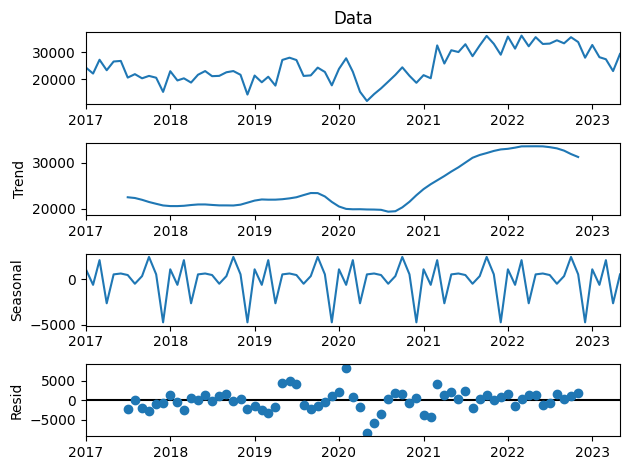

Multiplicative Decomposition


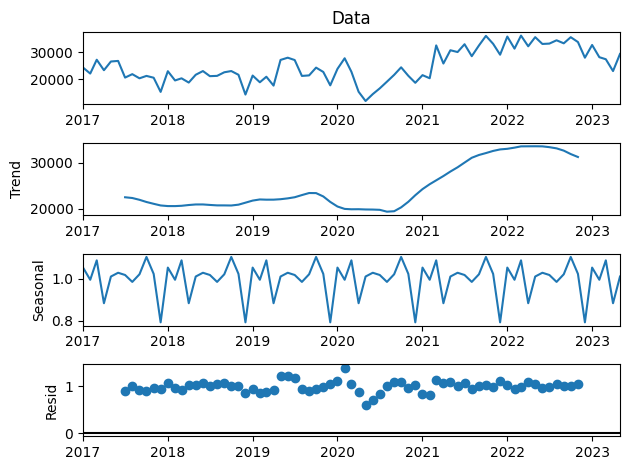

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



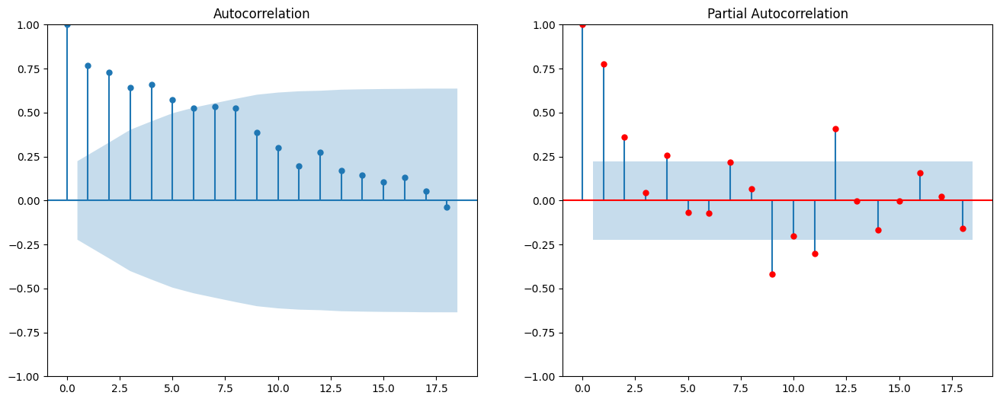

Local Skills Improvement Plan: Dorset
----------------------------------------------------------
Additive Decomposition


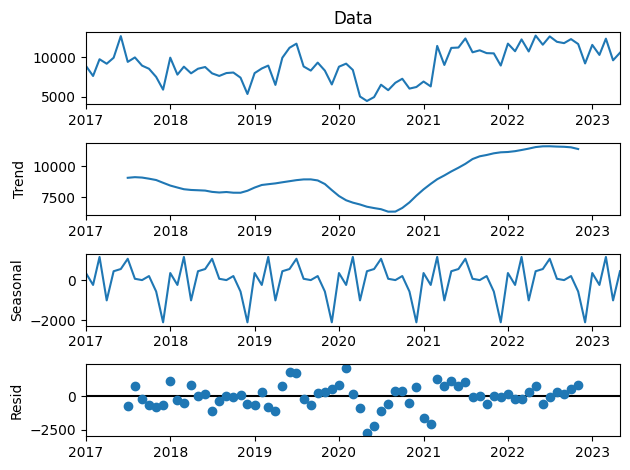

Multiplicative Decomposition


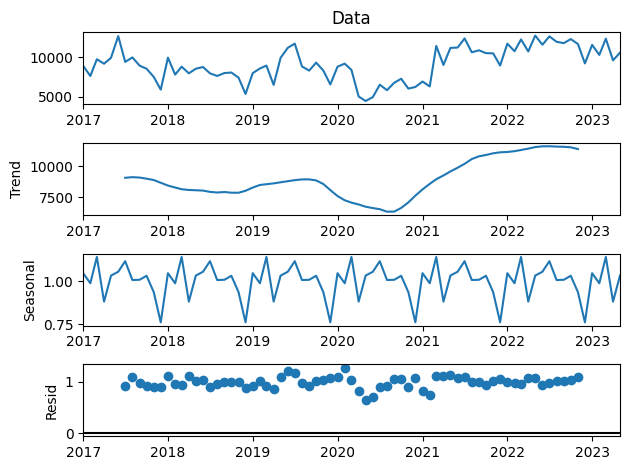

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



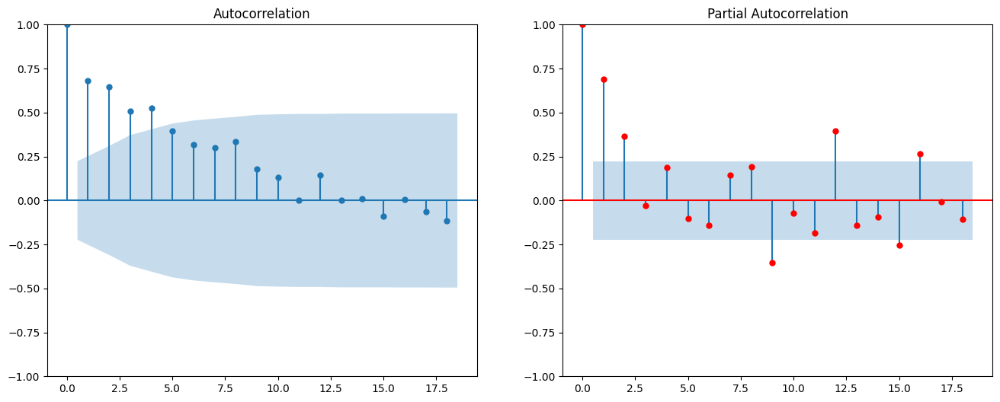

Local Skills Improvement Plan: Enterprise M3 LEP (including all of Surrey)
----------------------------------------------------------
Additive Decomposition


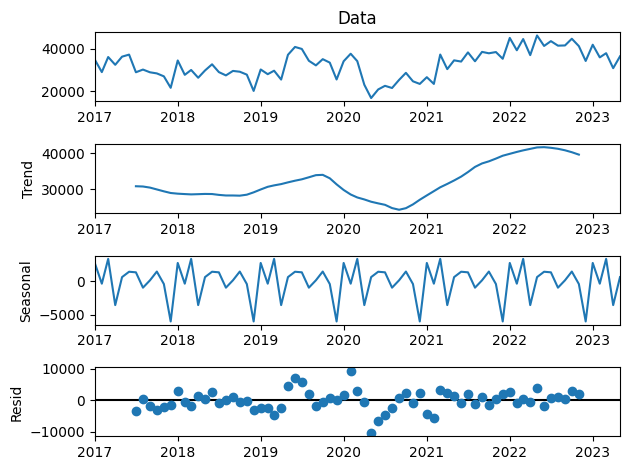

Multiplicative Decomposition


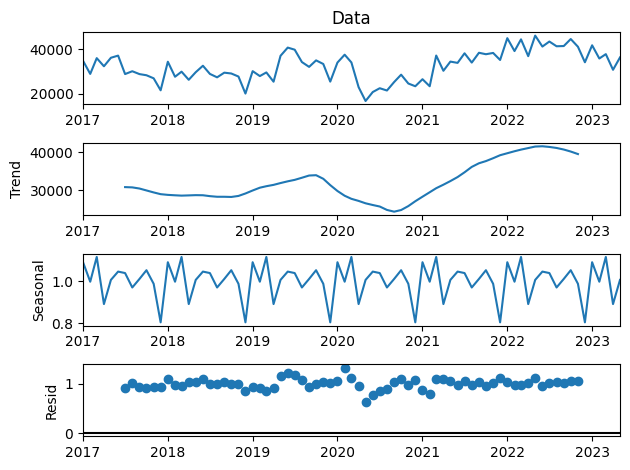

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



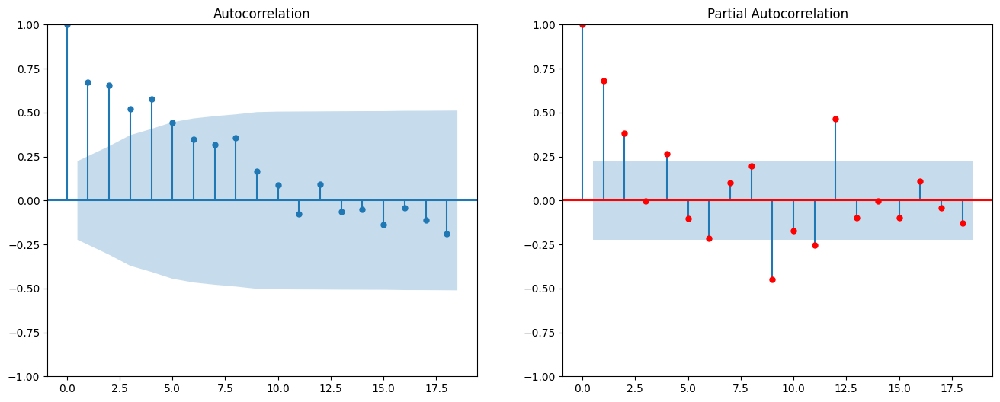

Local Skills Improvement Plan: Essex, SouthendonSea and Thurrock
----------------------------------------------------------
Additive Decomposition


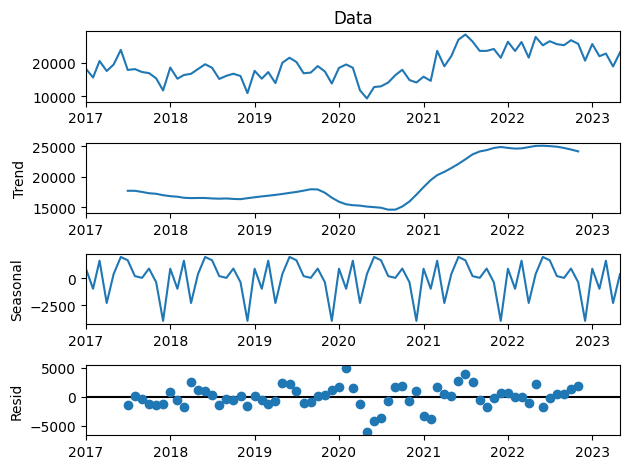

Multiplicative Decomposition


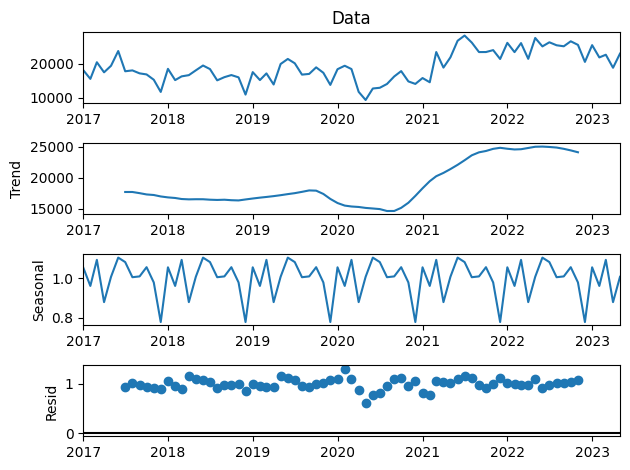

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



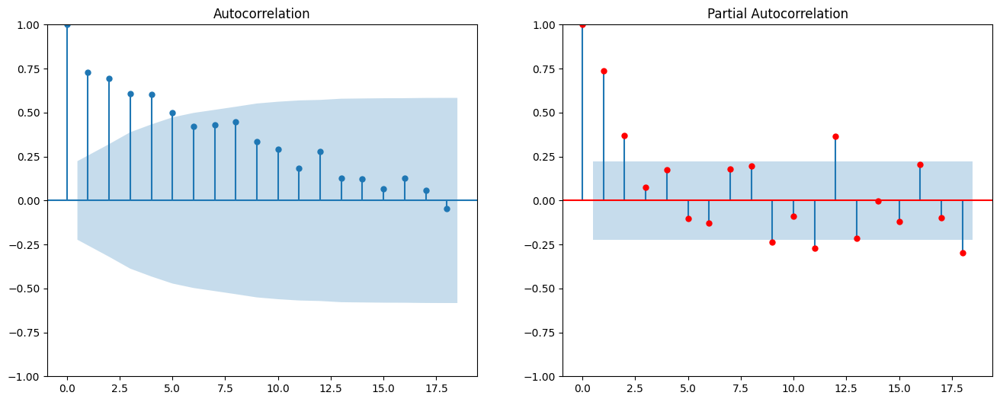

Local Skills Improvement Plan: Gloucestershire
----------------------------------------------------------
Additive Decomposition


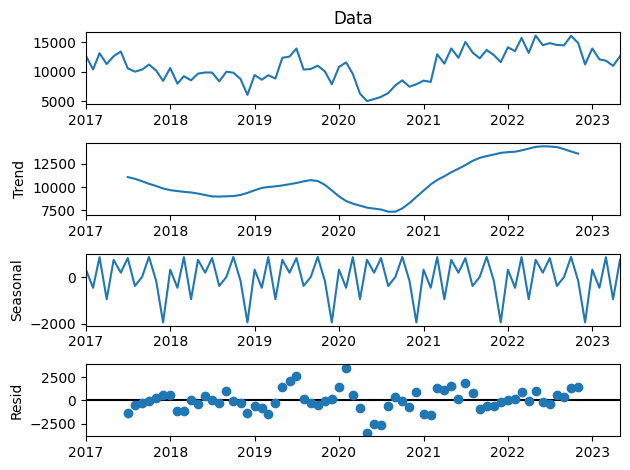

Multiplicative Decomposition


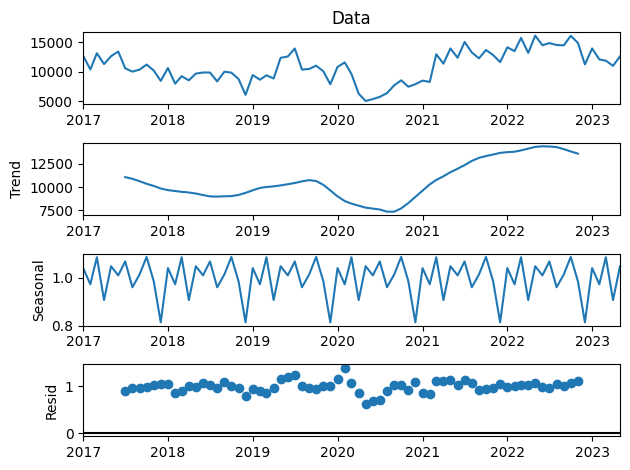

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



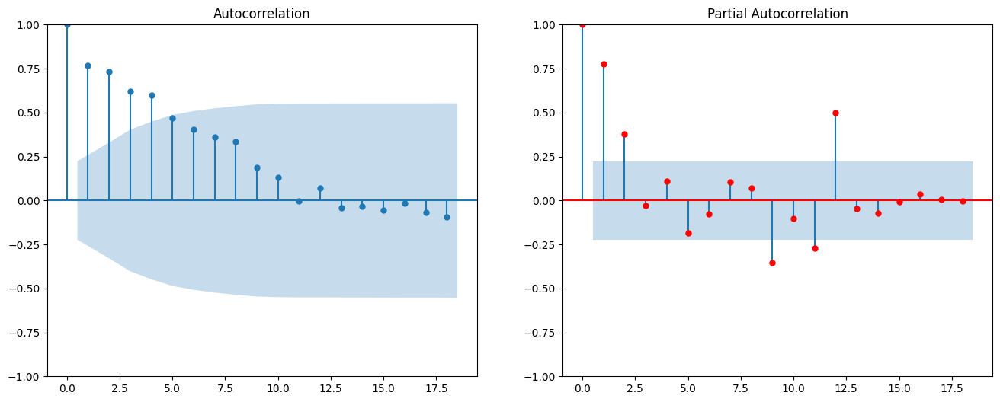

Local Skills Improvement Plan: Greater Lincolnshire
----------------------------------------------------------
Additive Decomposition


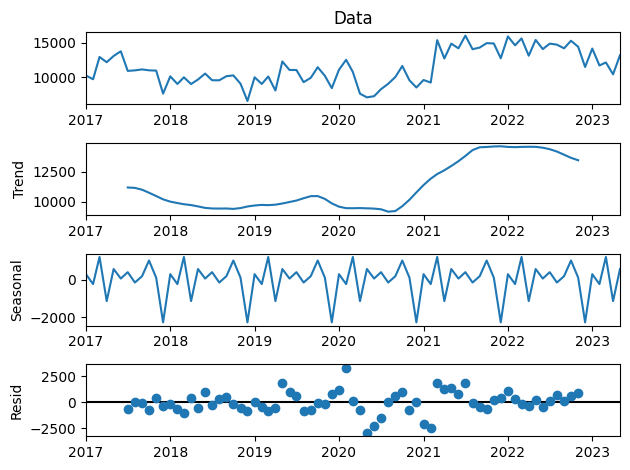

Multiplicative Decomposition


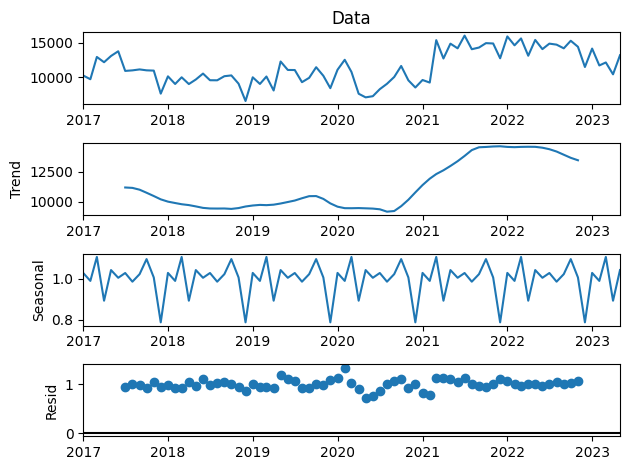

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



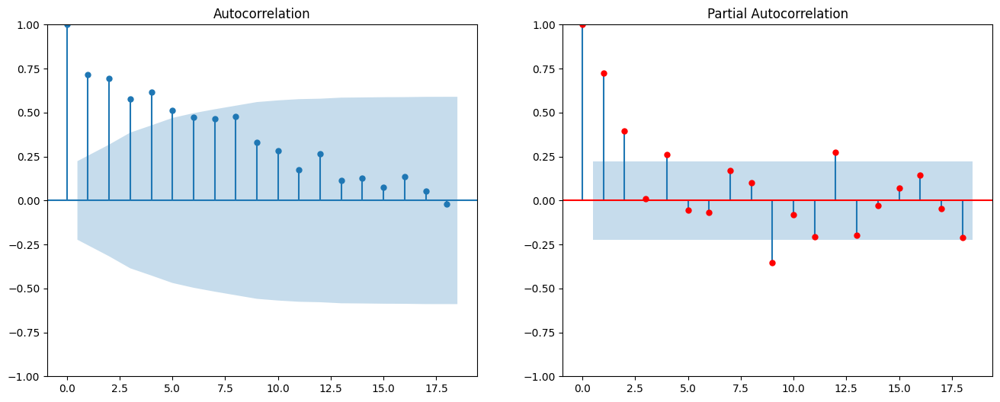

Local Skills Improvement Plan: Greater London
----------------------------------------------------------
Additive Decomposition


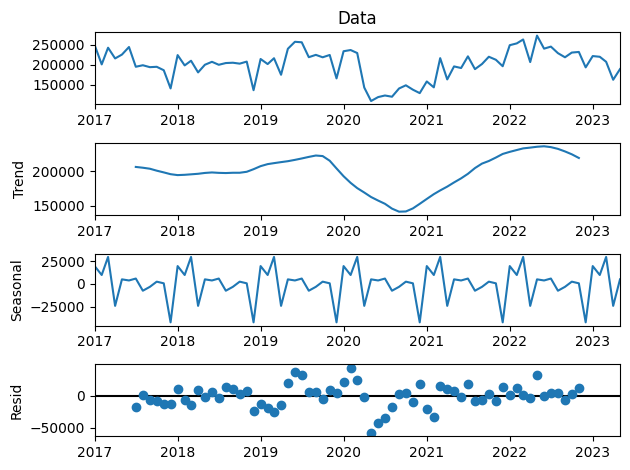

Multiplicative Decomposition


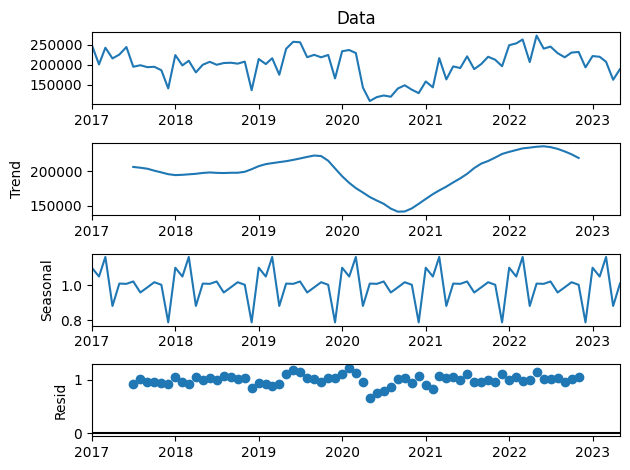

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



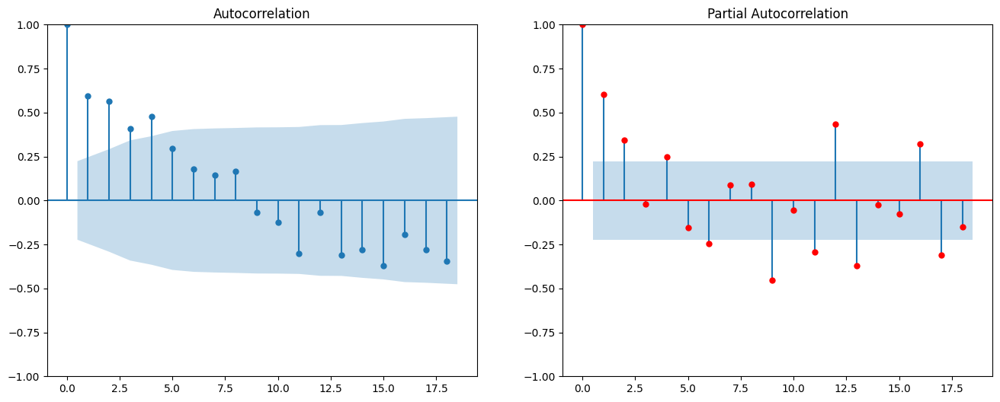

Local Skills Improvement Plan: Greater Manchester
----------------------------------------------------------
Additive Decomposition


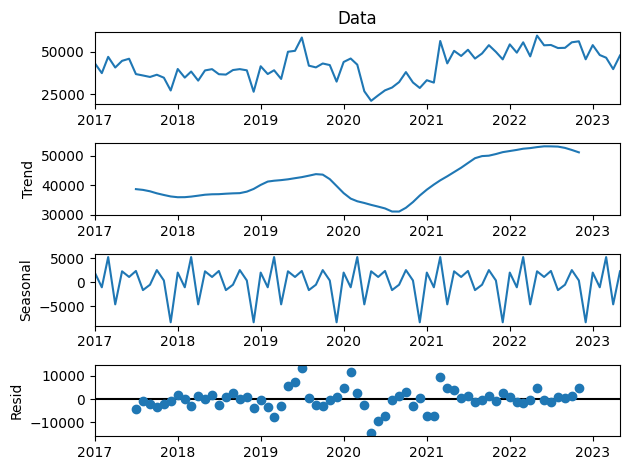

Multiplicative Decomposition


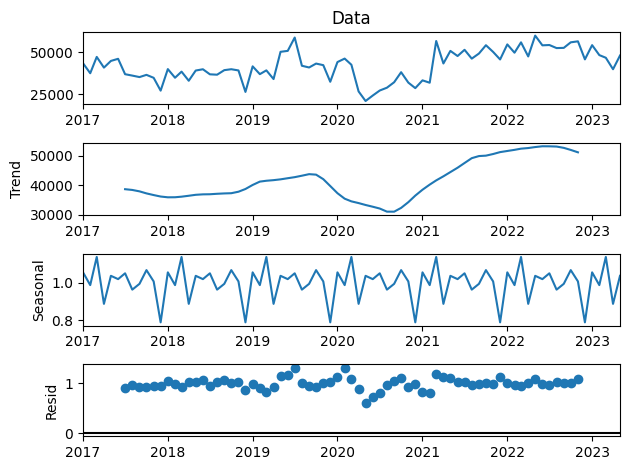

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



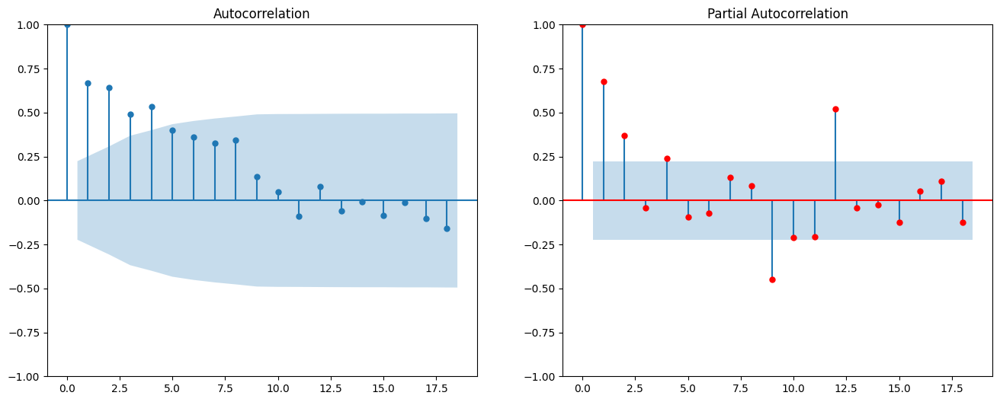

Local Skills Improvement Plan: Heart of the SouthWest
----------------------------------------------------------
Additive Decomposition


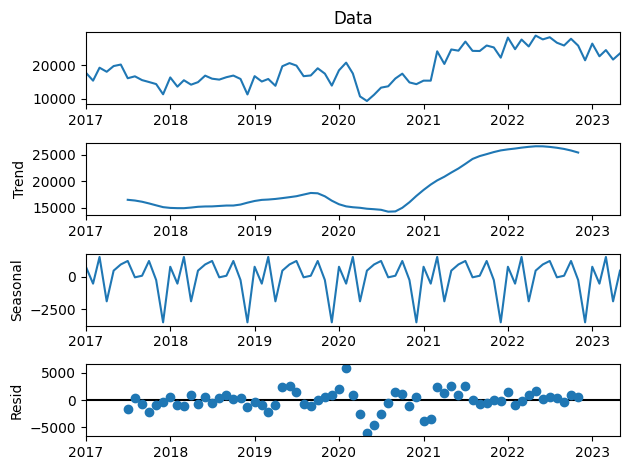

Multiplicative Decomposition


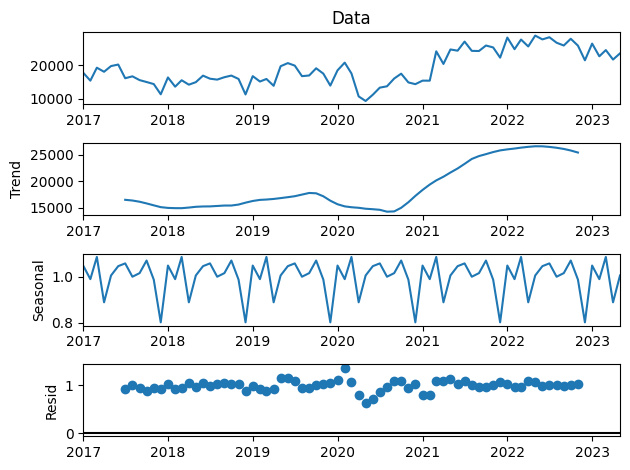

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



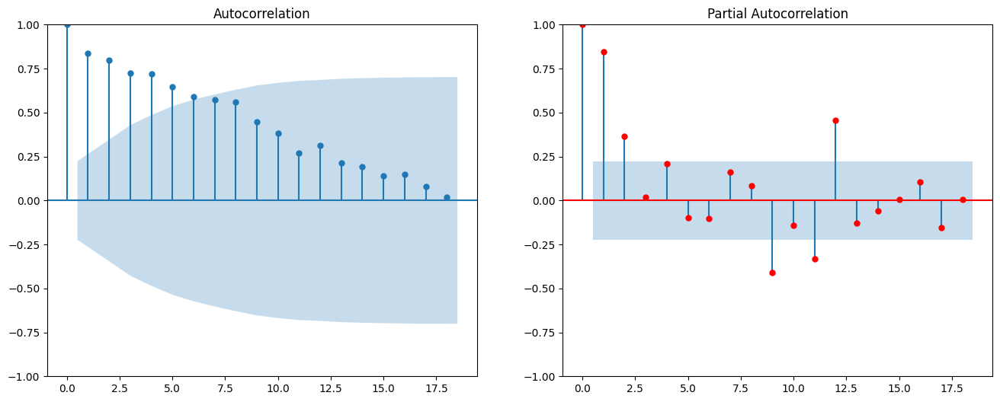

Local Skills Improvement Plan: Hertfordshire
----------------------------------------------------------
Additive Decomposition


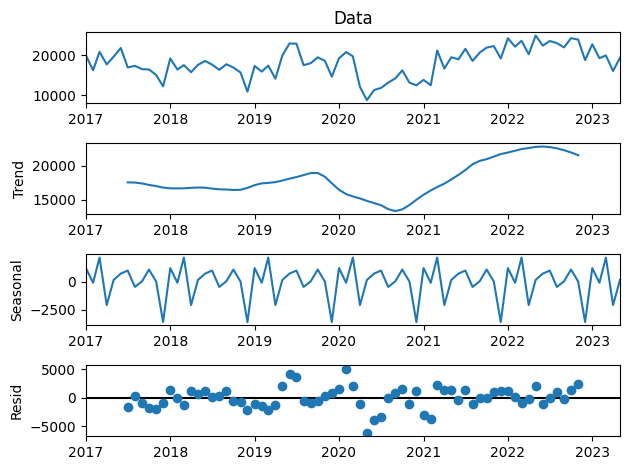

Multiplicative Decomposition


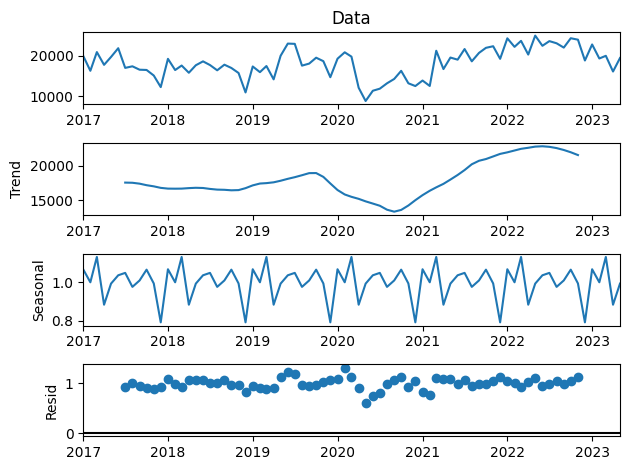

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



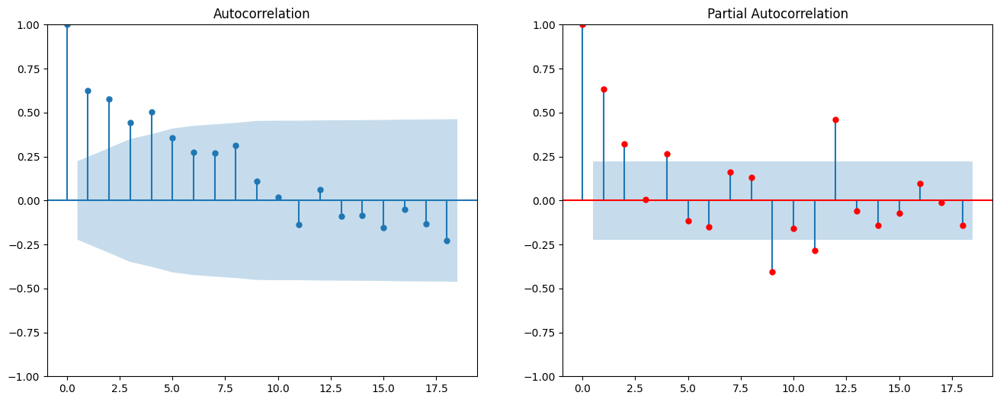

Local Skills Improvement Plan: Hull and East Yorkshire
----------------------------------------------------------
Additive Decomposition


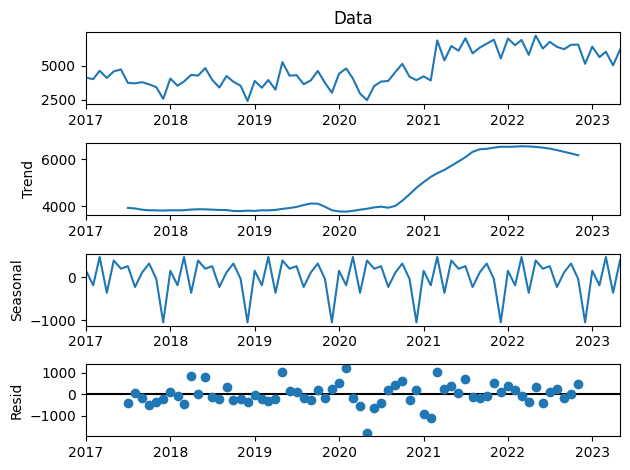

Multiplicative Decomposition


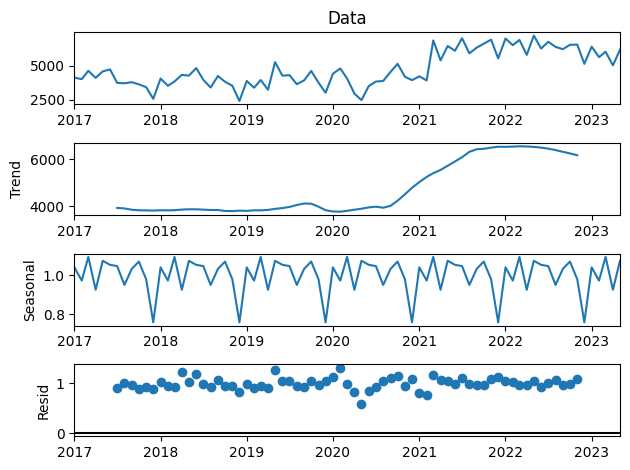

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



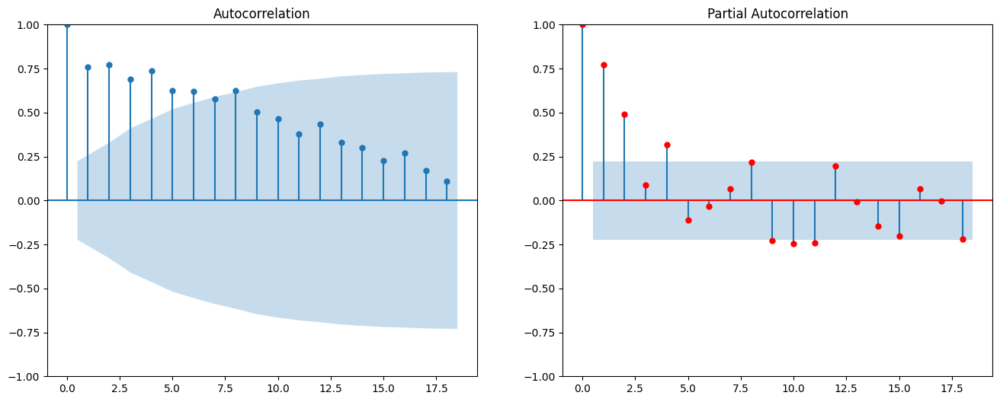

Local Skills Improvement Plan: Kent and Medway
----------------------------------------------------------
Additive Decomposition


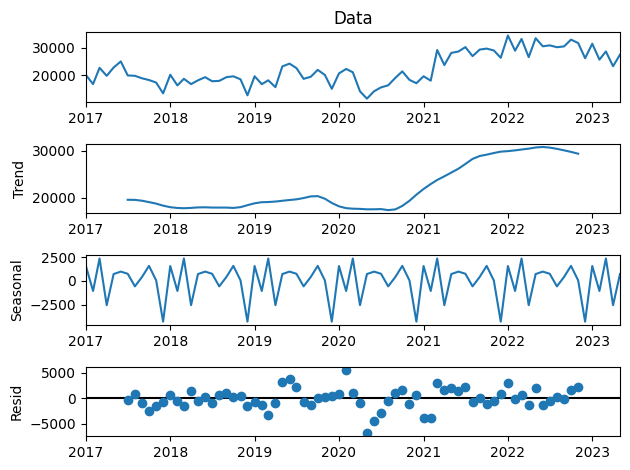

Multiplicative Decomposition


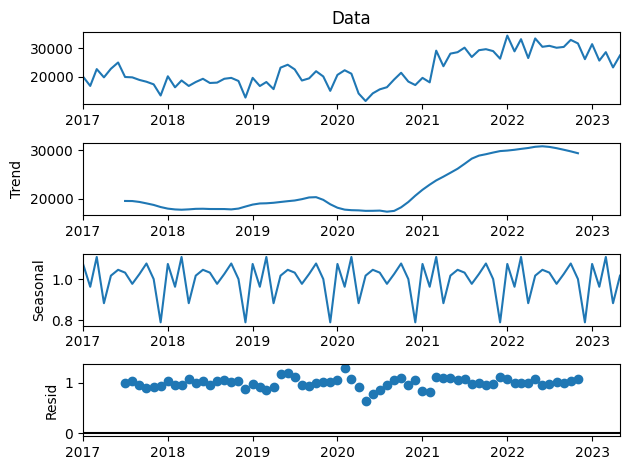

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



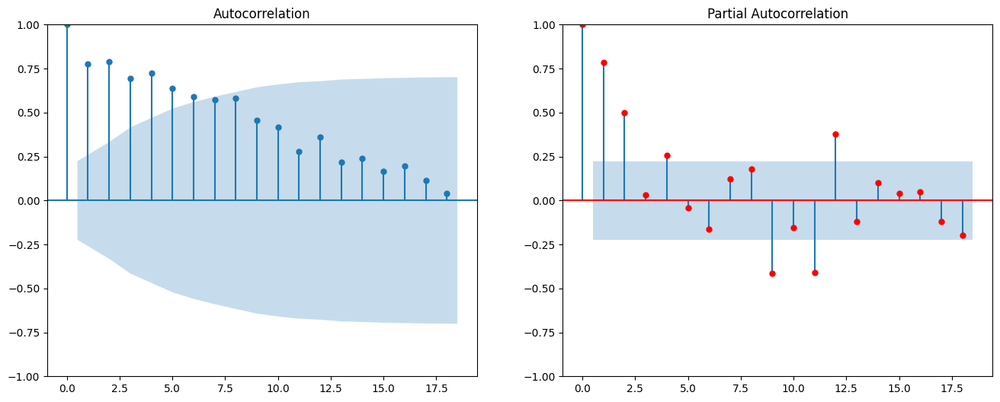

Local Skills Improvement Plan: Lancashire
----------------------------------------------------------
Additive Decomposition


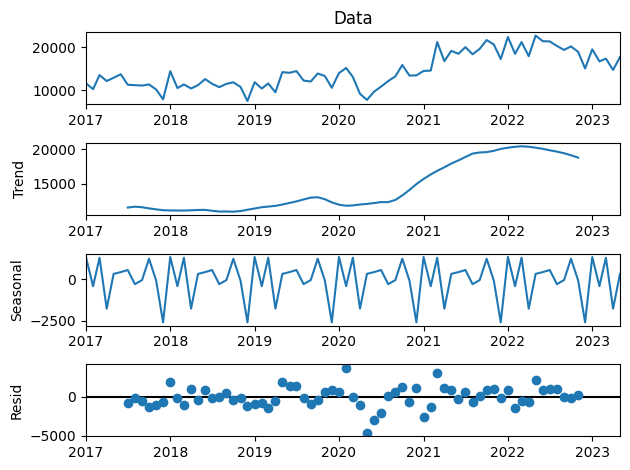

Multiplicative Decomposition


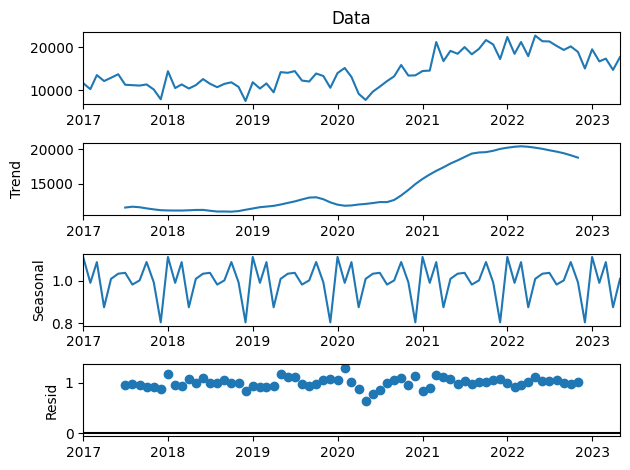

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



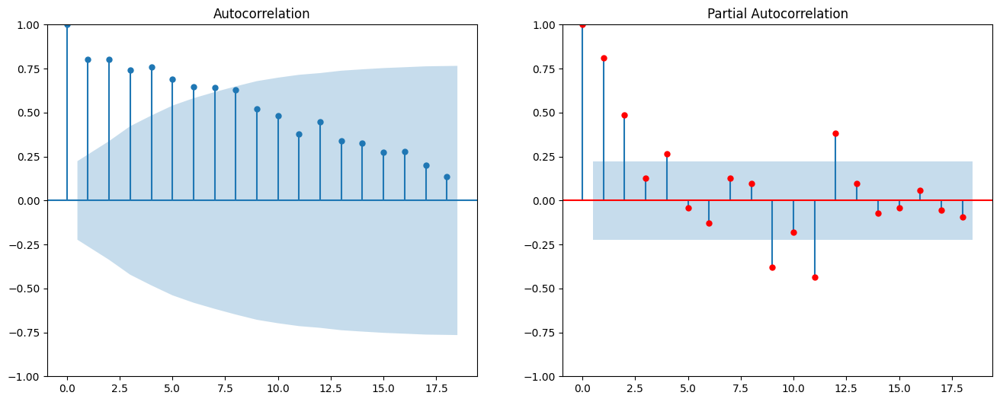

Local Skills Improvement Plan: Leicester and Leicestershire
----------------------------------------------------------
Additive Decomposition


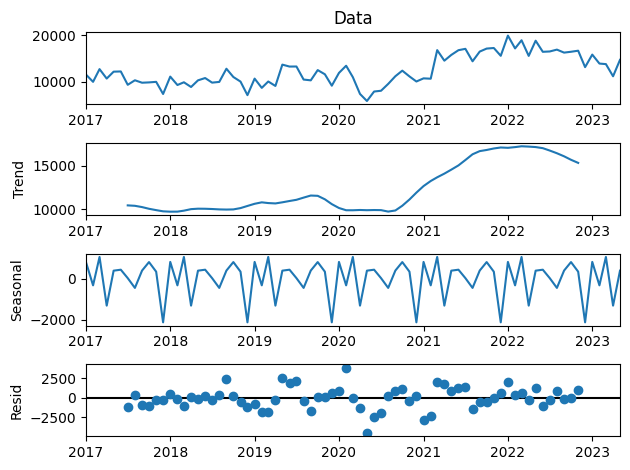

Multiplicative Decomposition


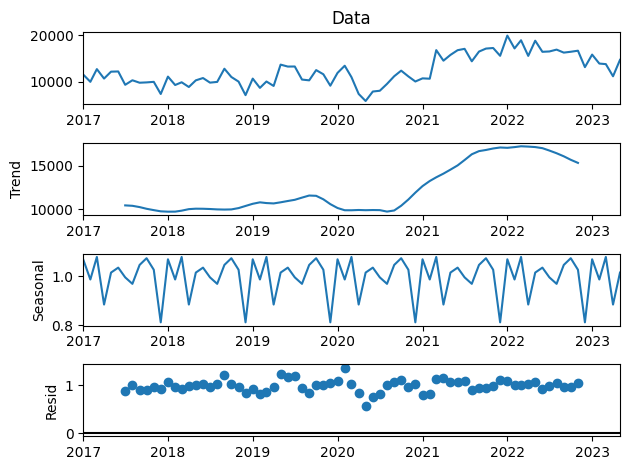

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



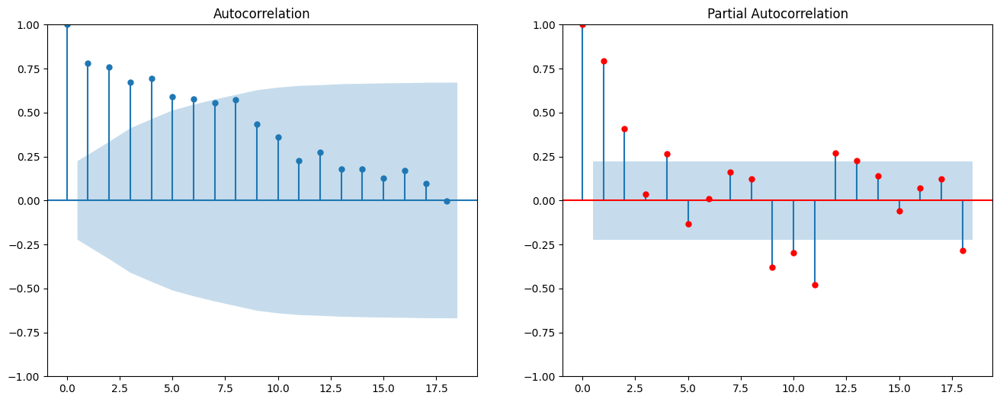

Local Skills Improvement Plan: Liverpool City Region
----------------------------------------------------------
Additive Decomposition


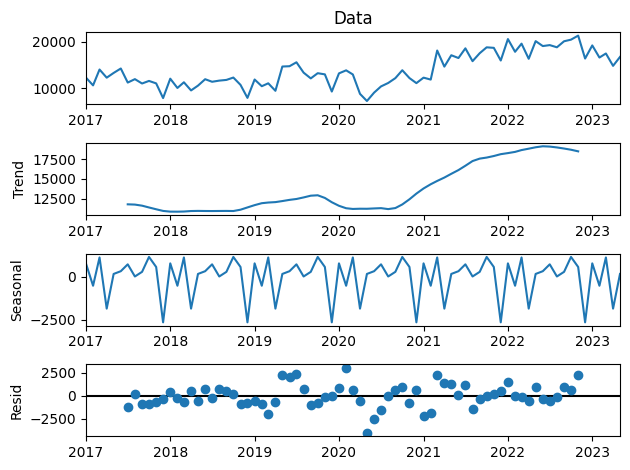

Multiplicative Decomposition


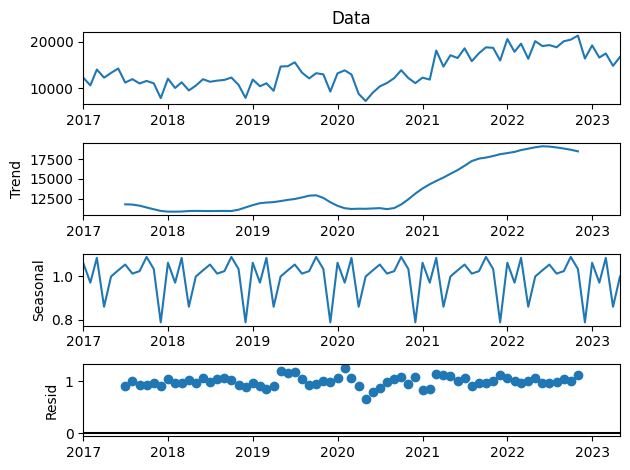

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



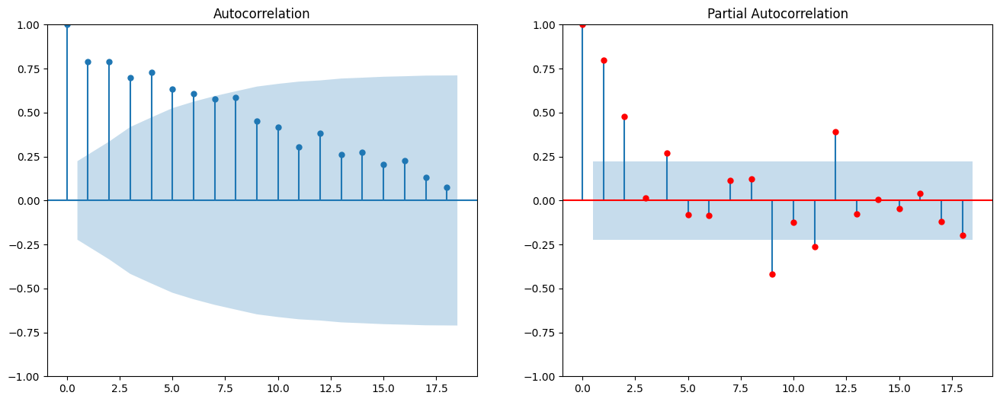

Local Skills Improvement Plan: Norfolk and Suffolk
----------------------------------------------------------
Additive Decomposition


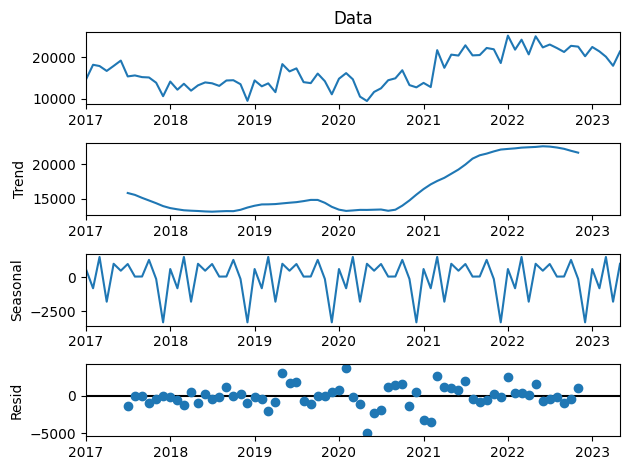

Multiplicative Decomposition


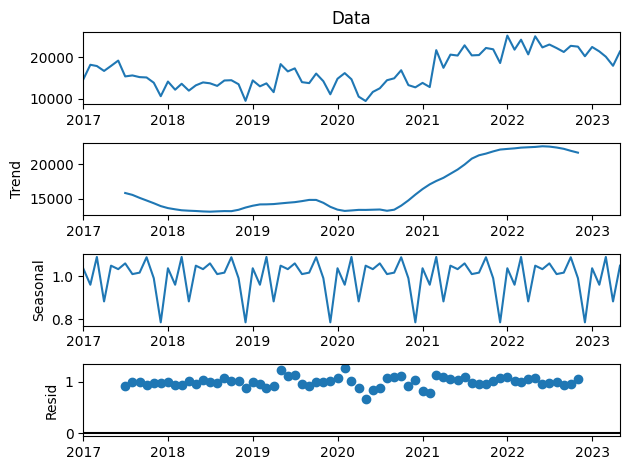

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



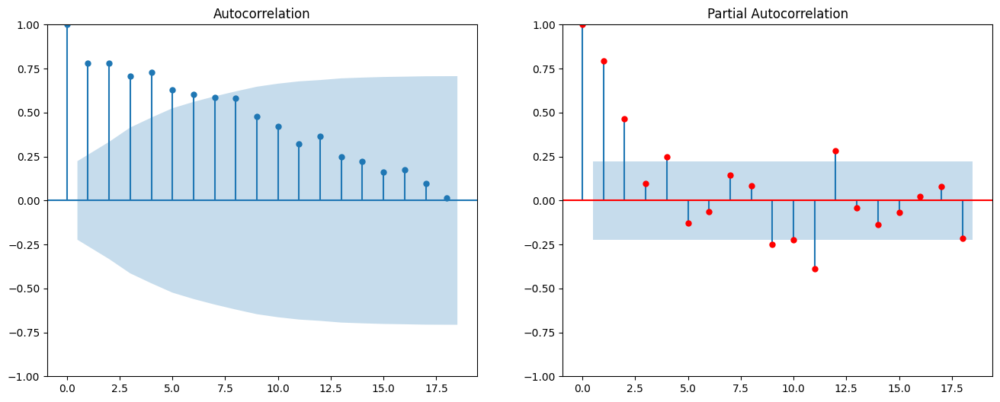

Local Skills Improvement Plan: North East
----------------------------------------------------------
Additive Decomposition


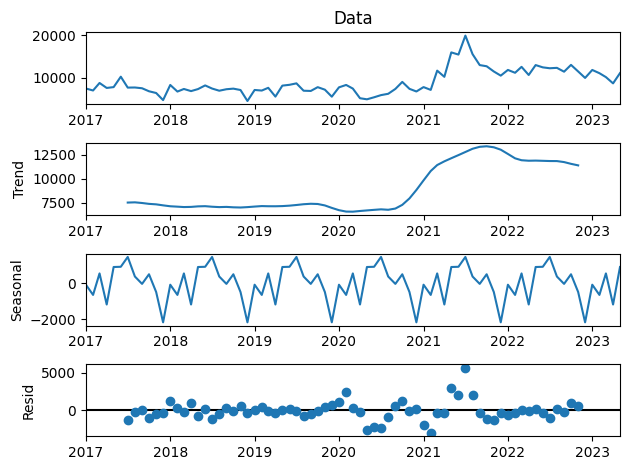

Multiplicative Decomposition


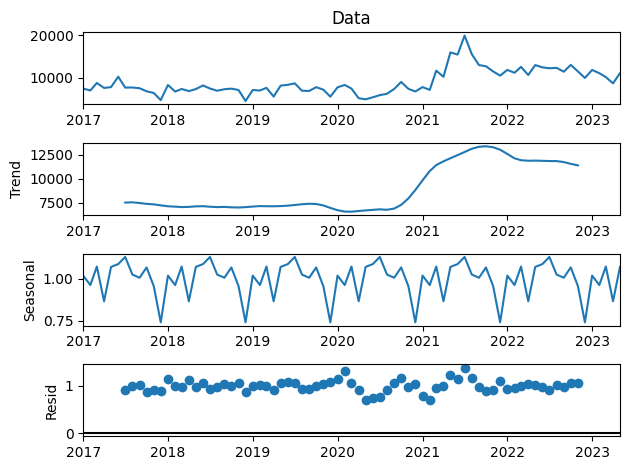

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



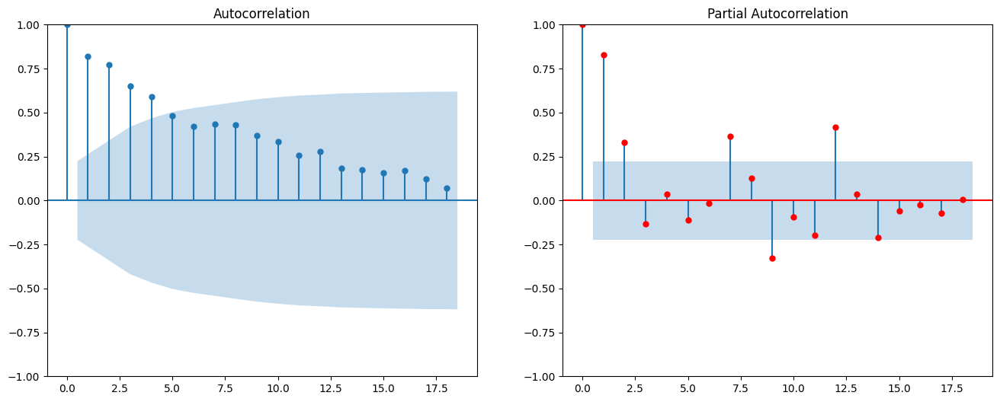

Local Skills Improvement Plan: North of Tyne
----------------------------------------------------------
Additive Decomposition


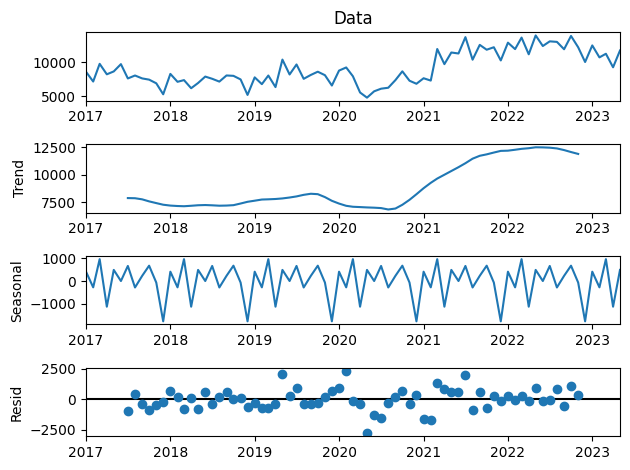

Multiplicative Decomposition


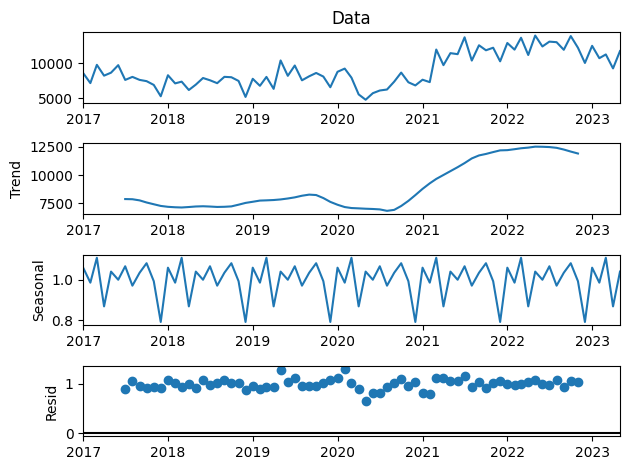

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



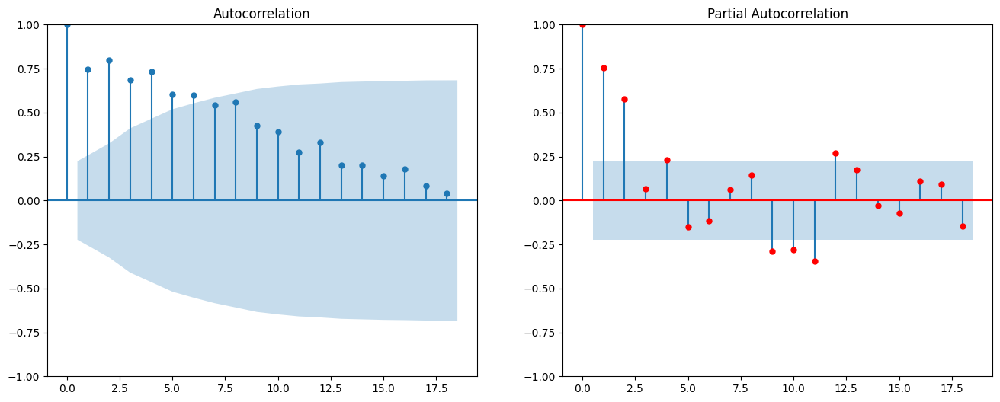

Local Skills Improvement Plan: Oxfordshire
----------------------------------------------------------
Additive Decomposition


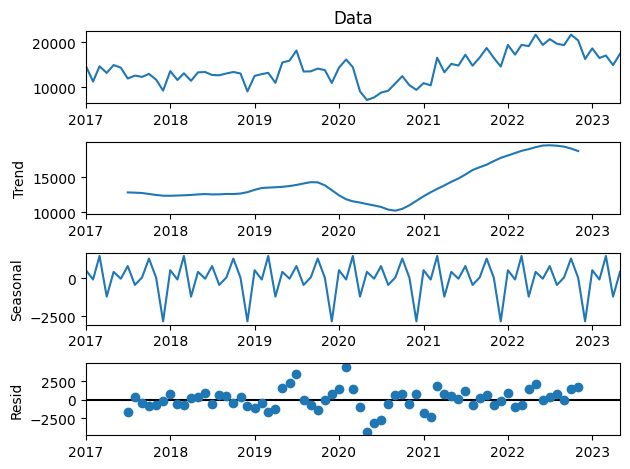

Multiplicative Decomposition


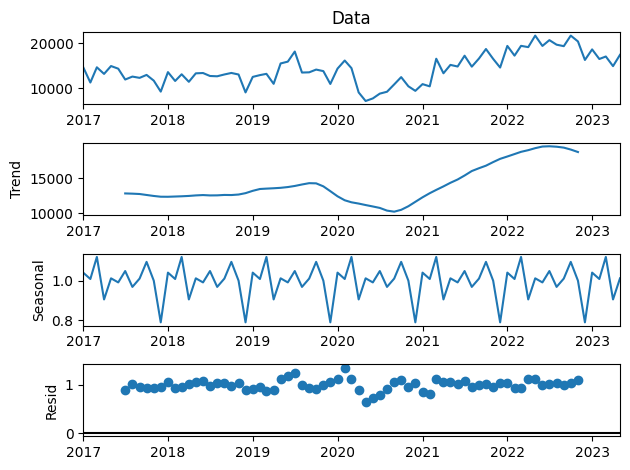

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



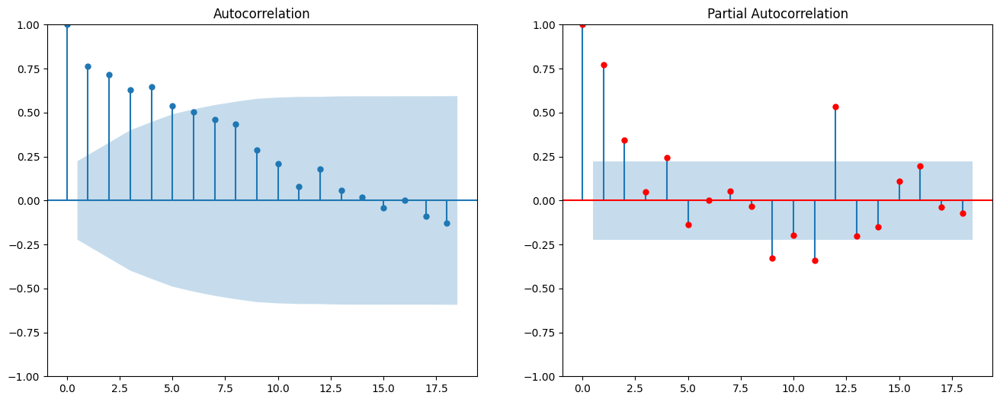

Local Skills Improvement Plan: Solent
----------------------------------------------------------
Additive Decomposition


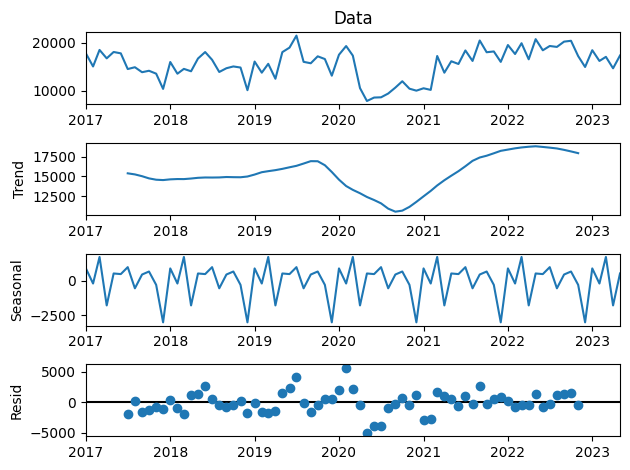

Multiplicative Decomposition


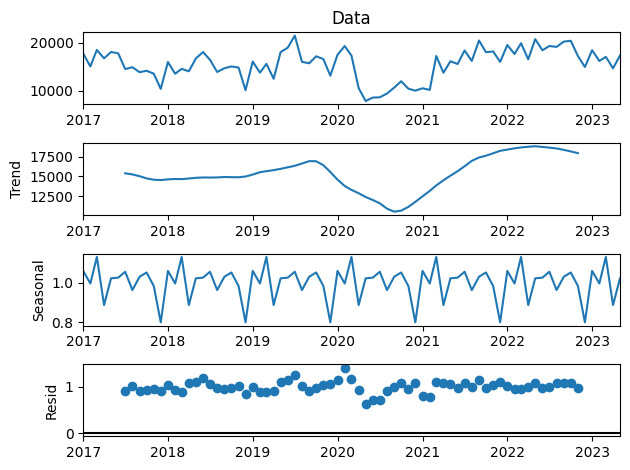

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



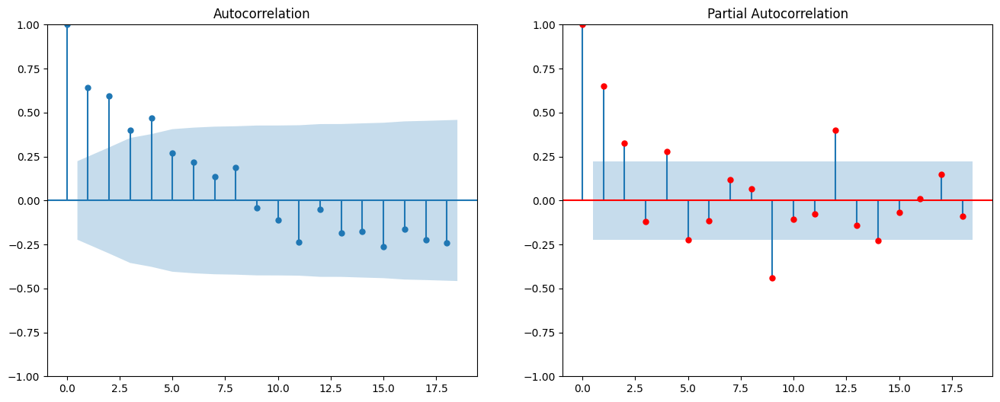

Local Skills Improvement Plan: South East Midlands
----------------------------------------------------------
Additive Decomposition


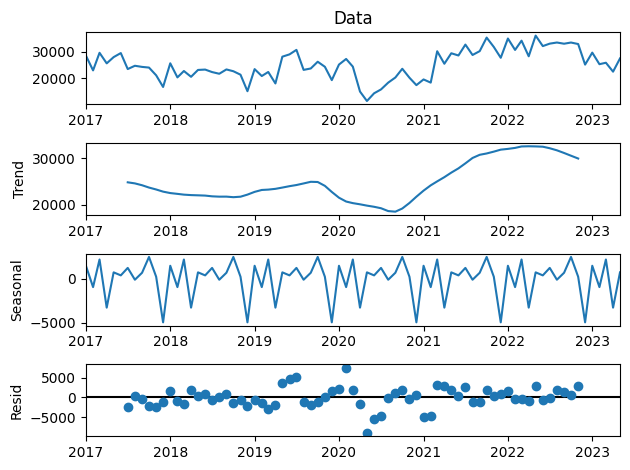

Multiplicative Decomposition


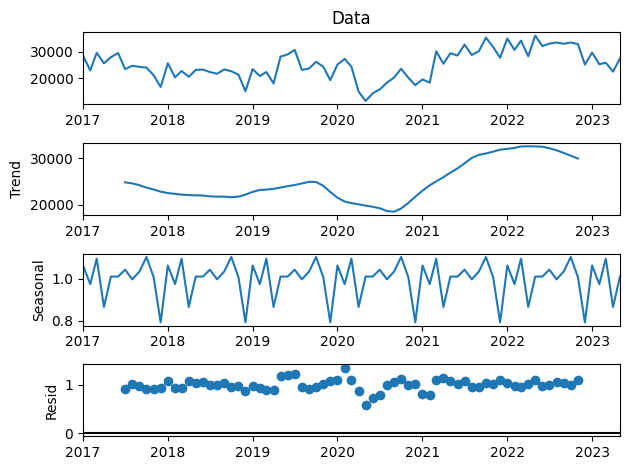

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



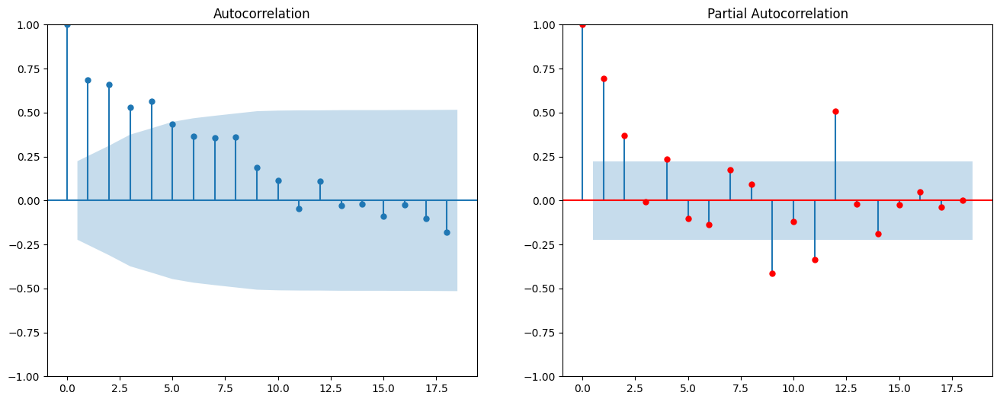

Local Skills Improvement Plan: South Yorkshire
----------------------------------------------------------
Additive Decomposition


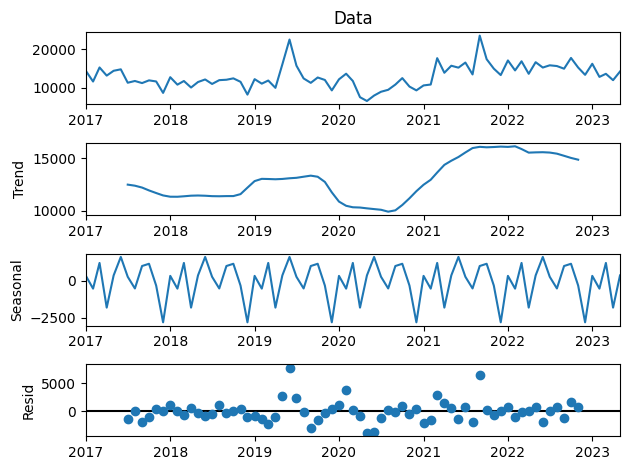

Multiplicative Decomposition


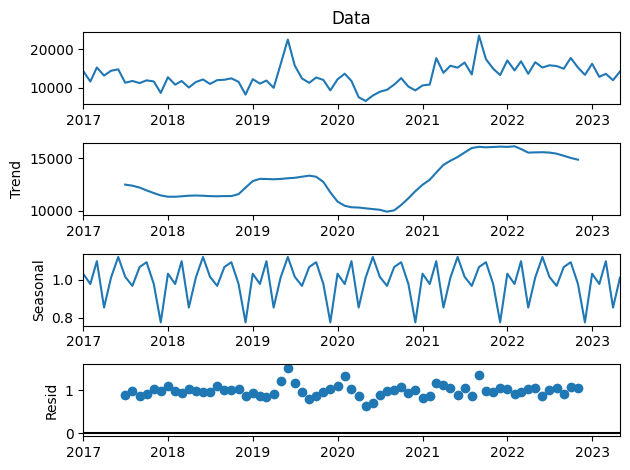

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



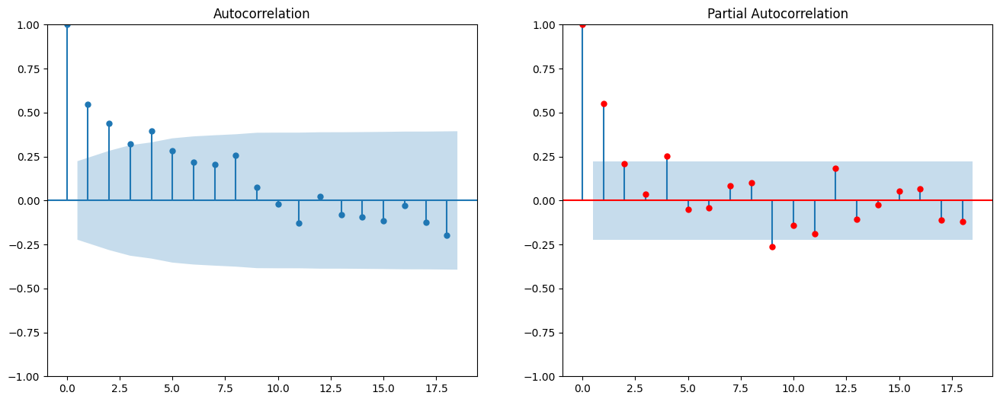

Local Skills Improvement Plan: StokeonTrent and Staffordshire
----------------------------------------------------------
Additive Decomposition


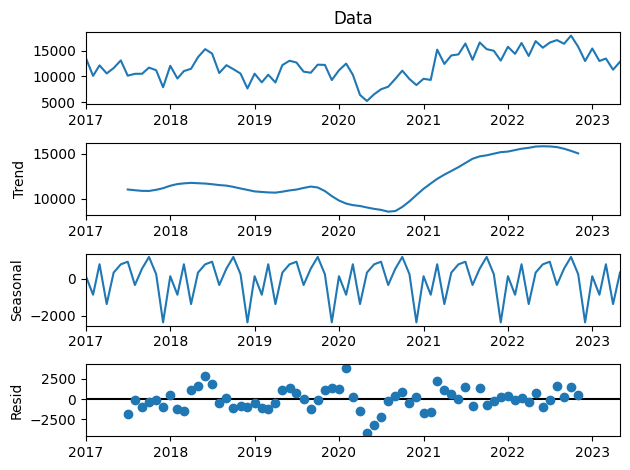

Multiplicative Decomposition


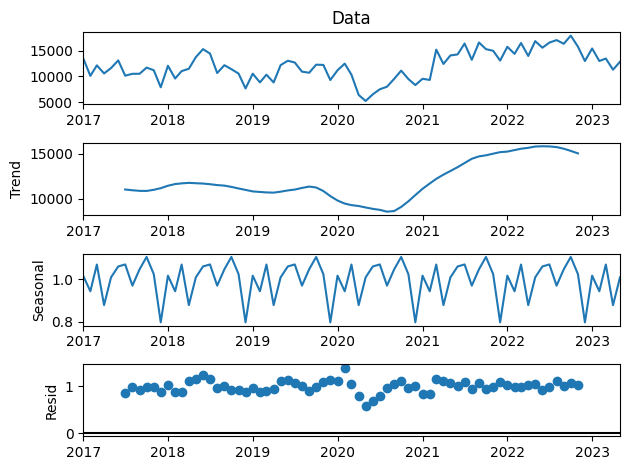

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



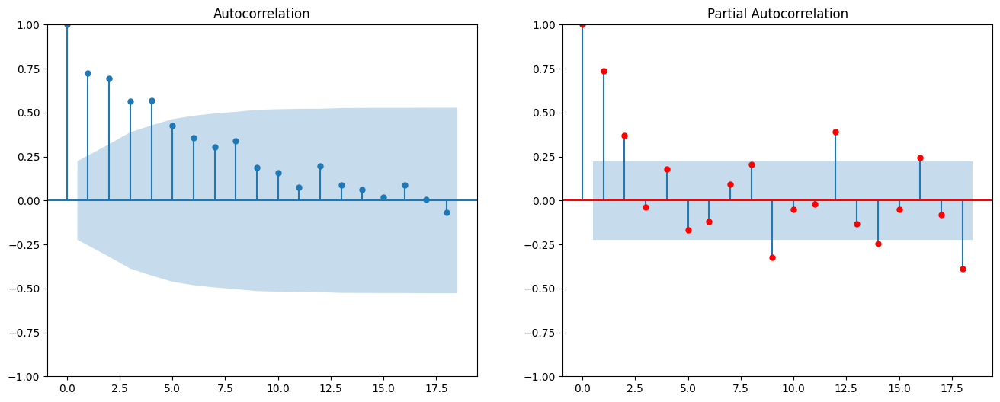

Local Skills Improvement Plan: Swindon and Wiltshire
----------------------------------------------------------
Additive Decomposition


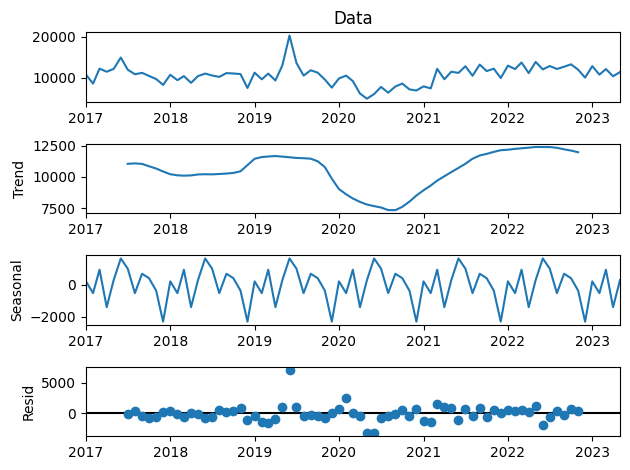

Multiplicative Decomposition


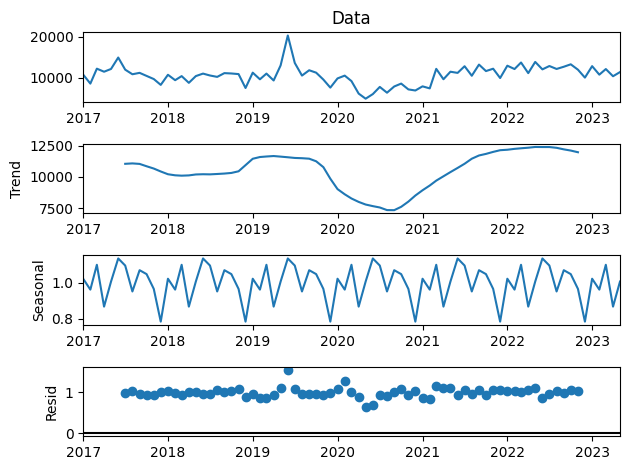

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



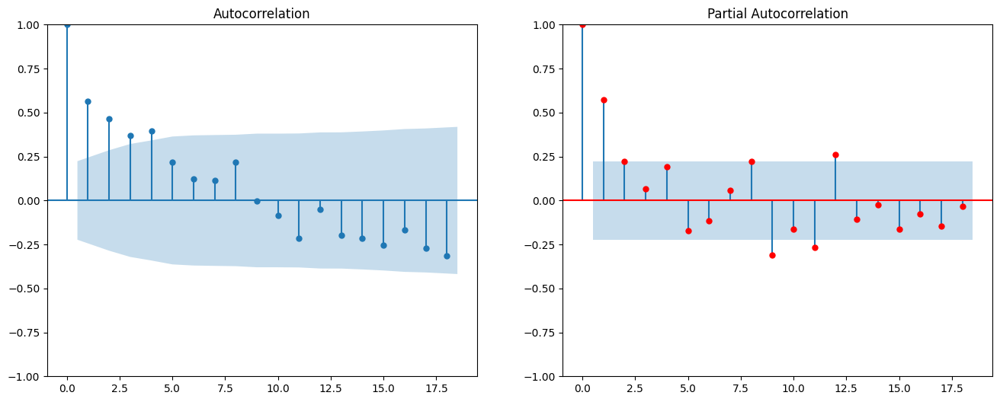

Local Skills Improvement Plan: Tees Valley
----------------------------------------------------------
Additive Decomposition


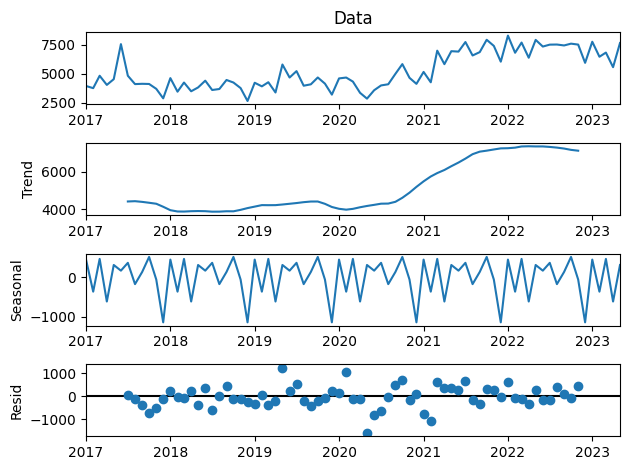

Multiplicative Decomposition


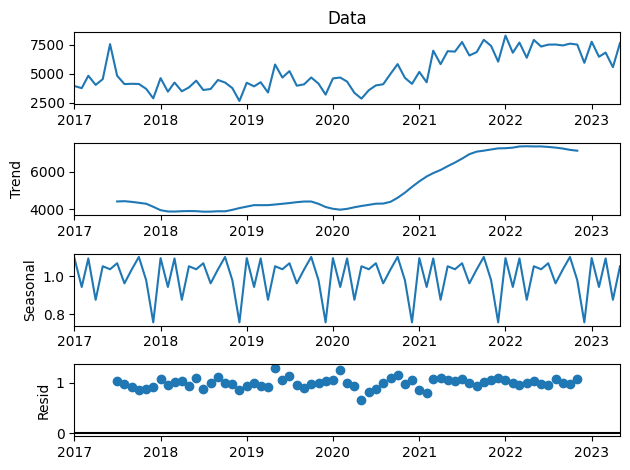

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



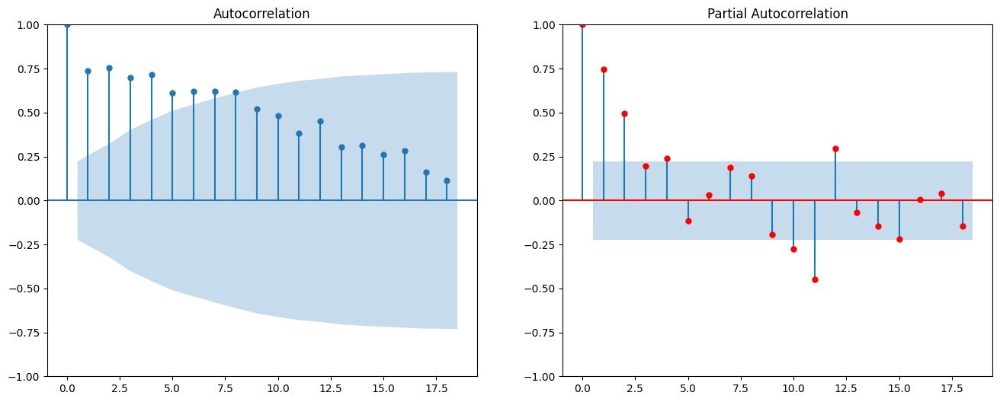

Local Skills Improvement Plan: Thames Valley Berkshire
----------------------------------------------------------
Additive Decomposition


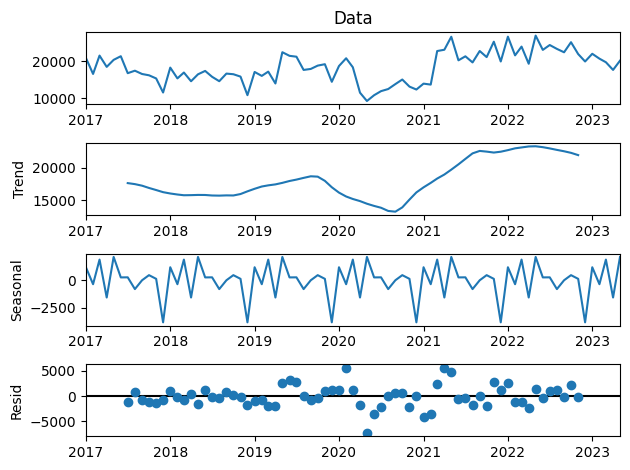

Multiplicative Decomposition


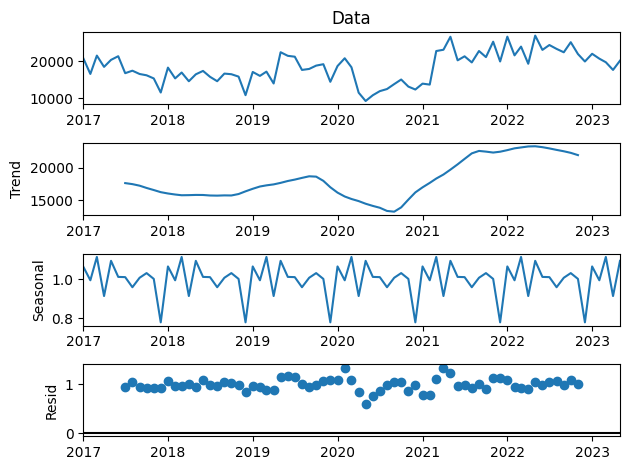

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



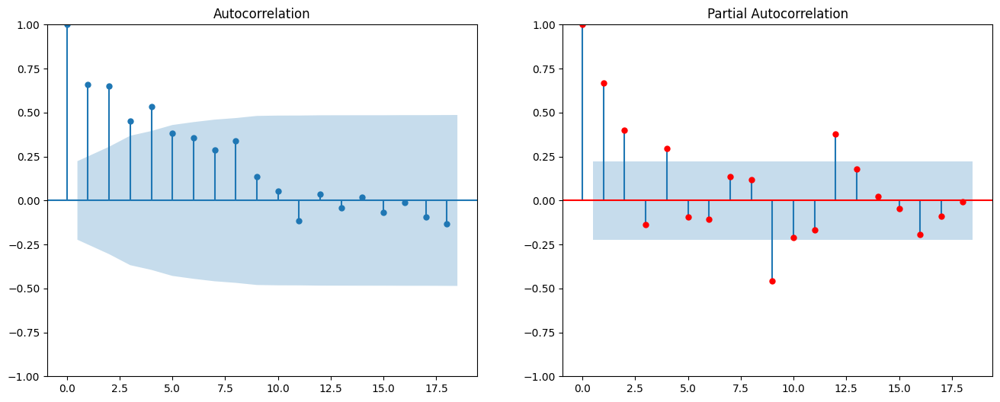

Local Skills Improvement Plan: The Marches
----------------------------------------------------------
Additive Decomposition


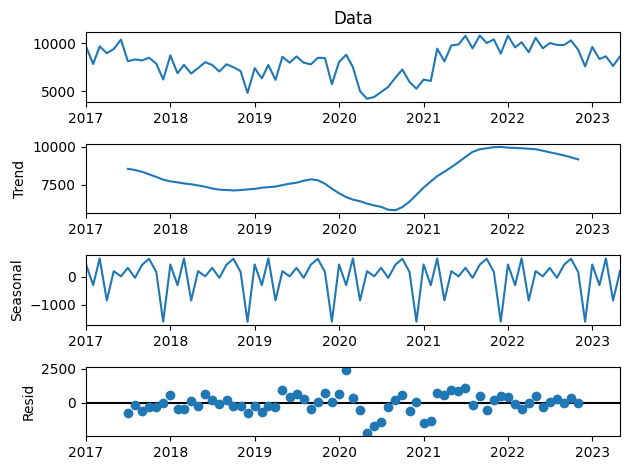

Multiplicative Decomposition


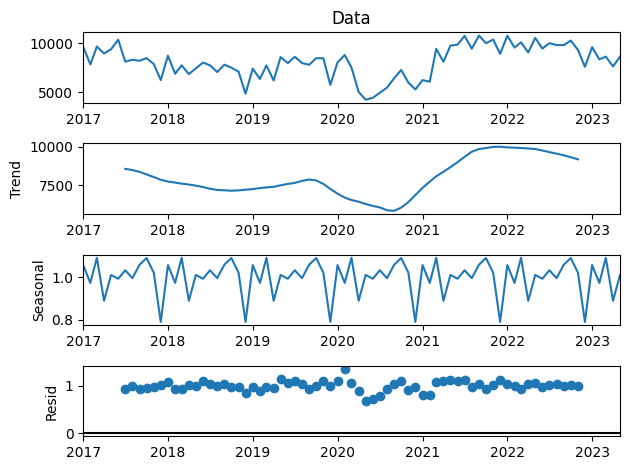

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



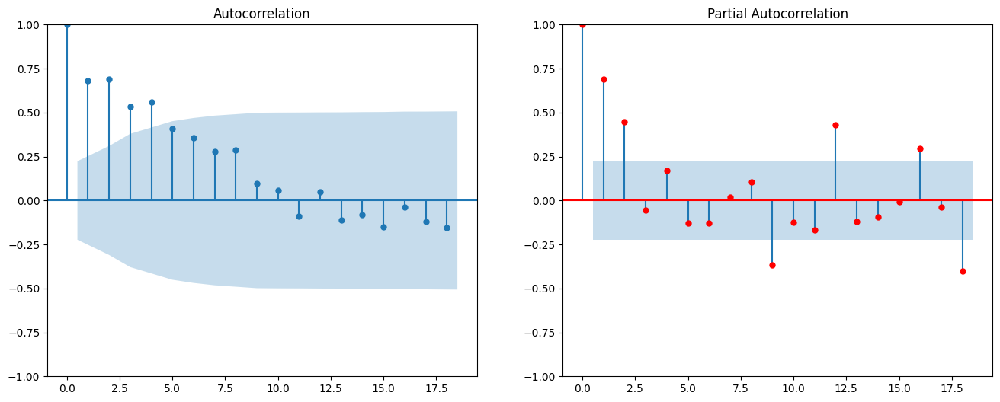

Local Skills Improvement Plan: West Midlands and Warwickshire
----------------------------------------------------------
Additive Decomposition


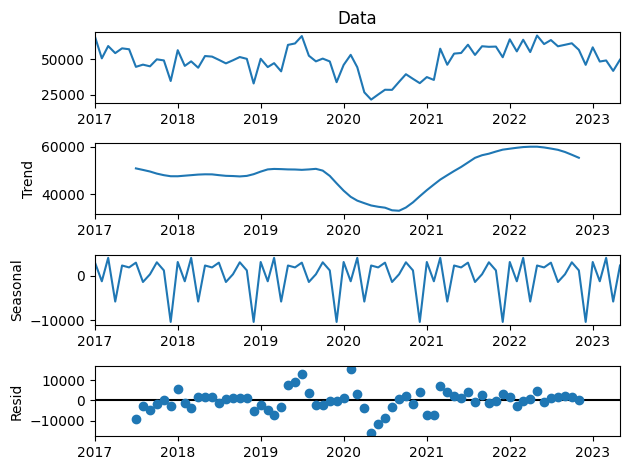

Multiplicative Decomposition


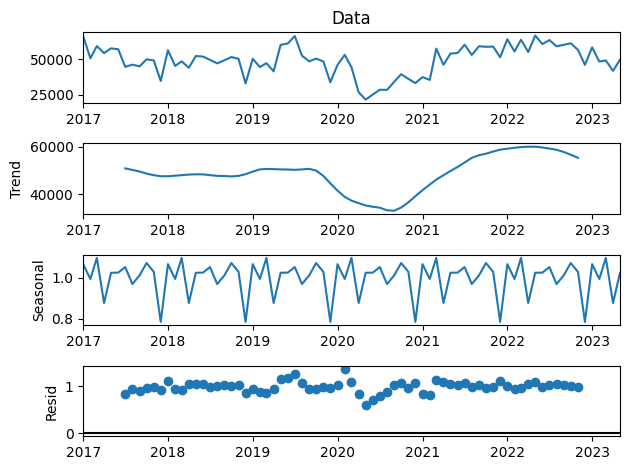

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



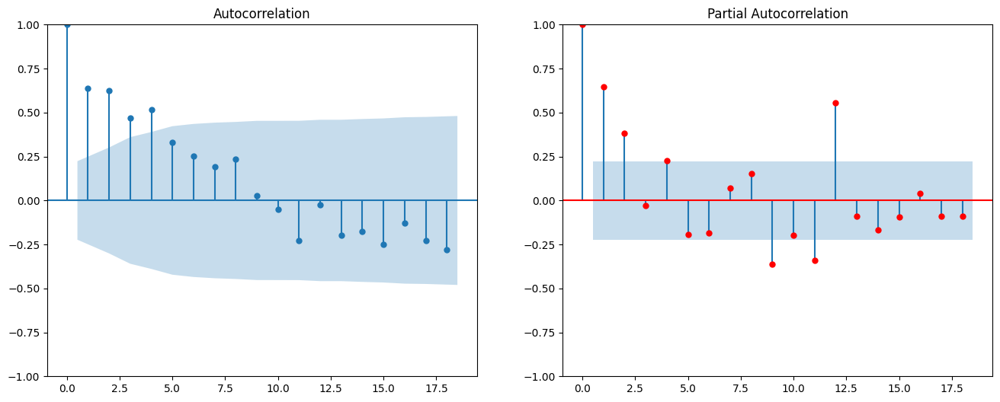

Local Skills Improvement Plan: West Yorkshire
----------------------------------------------------------
Additive Decomposition


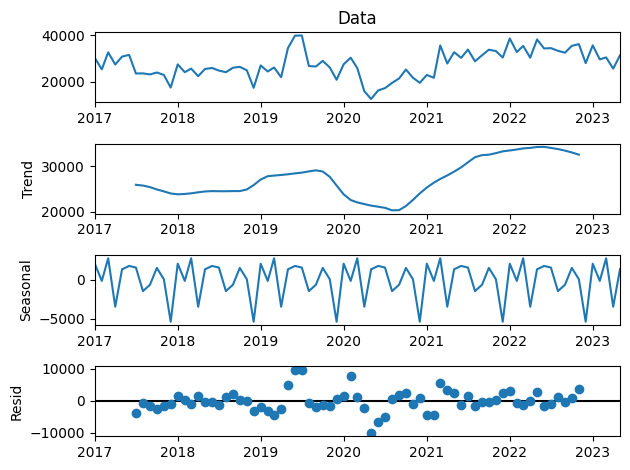

Multiplicative Decomposition


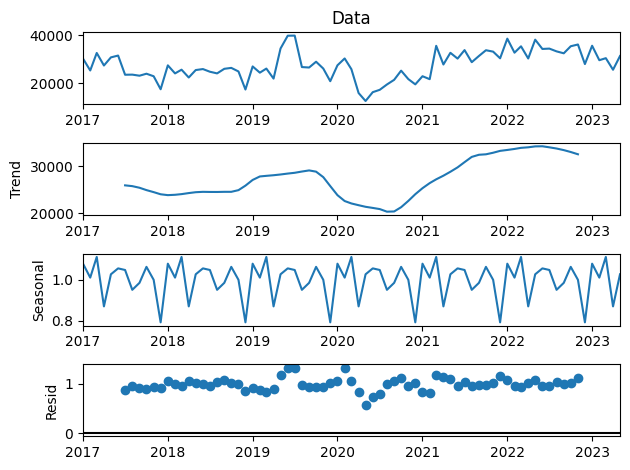

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



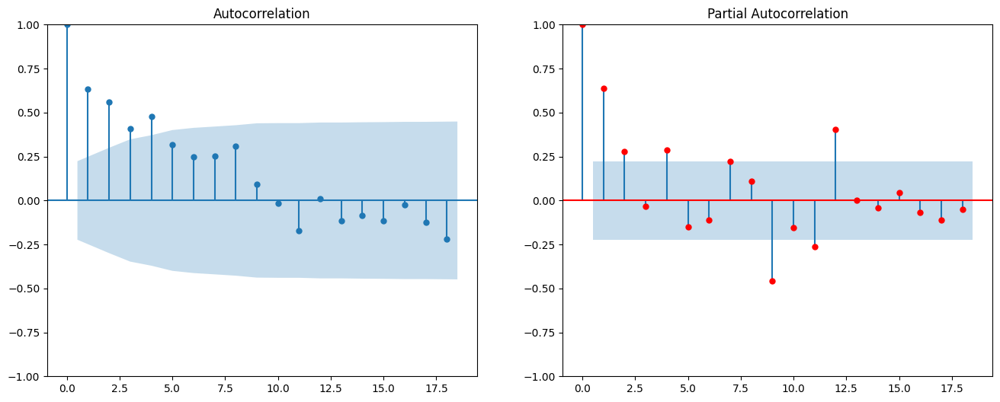

Local Skills Improvement Plan: West of England and North Somerset
----------------------------------------------------------
Additive Decomposition


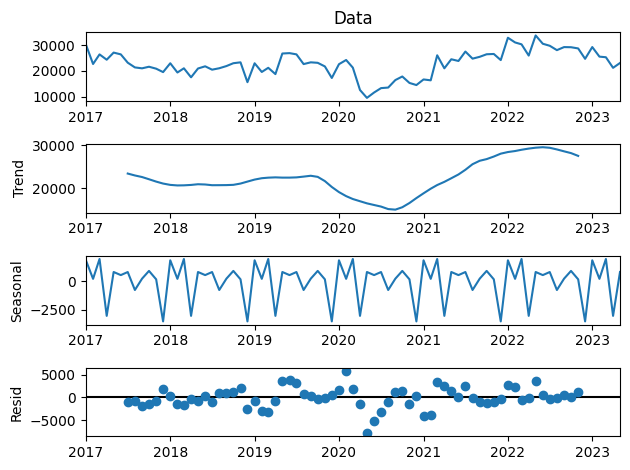

Multiplicative Decomposition


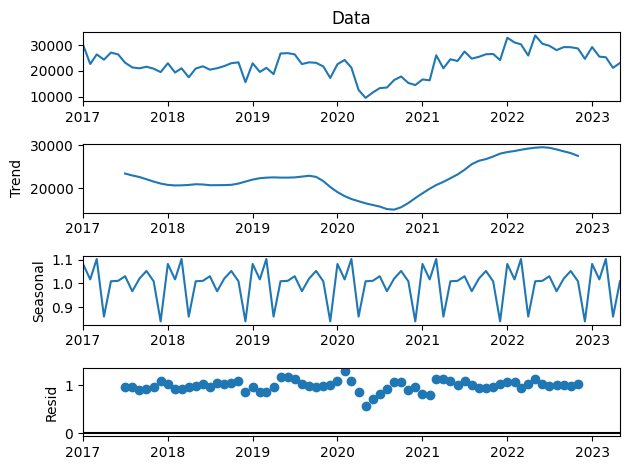

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



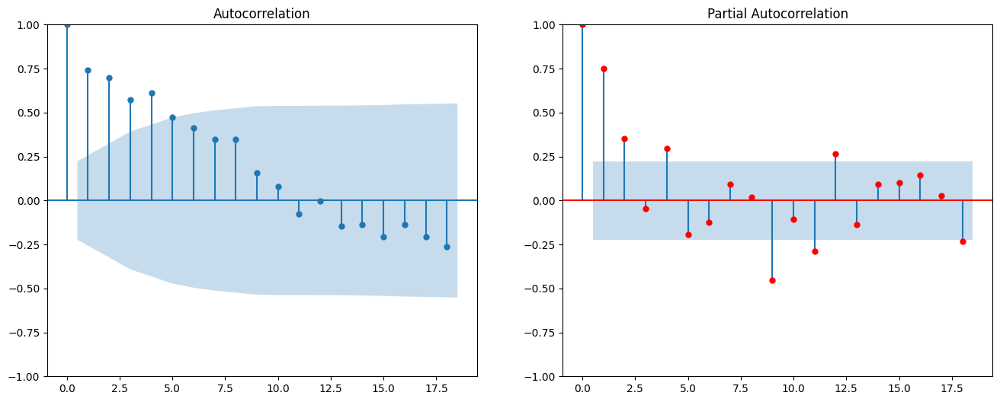

Local Skills Improvement Plan: Worcestershire
----------------------------------------------------------
Additive Decomposition


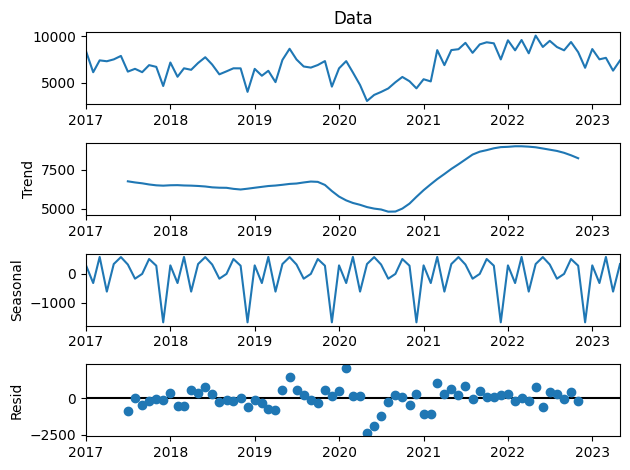

Multiplicative Decomposition


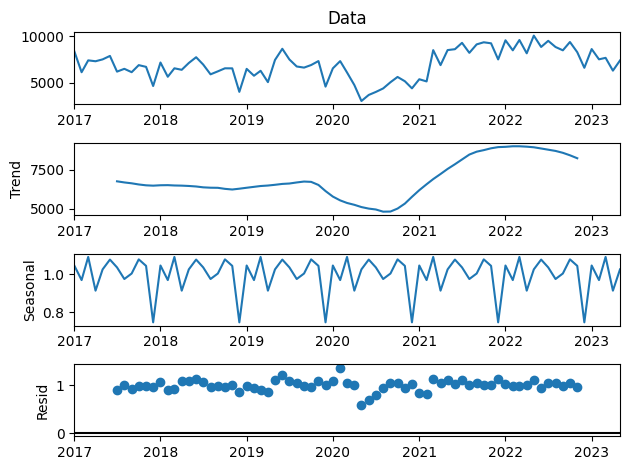

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



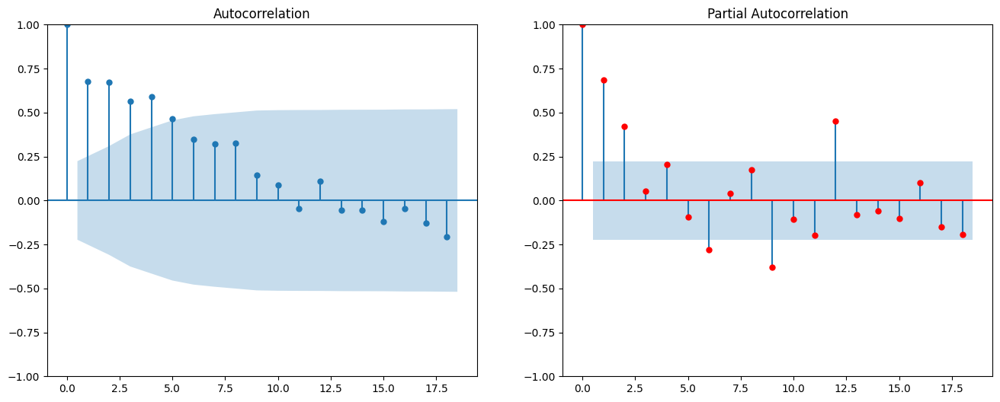

Local Skills Improvement Plan: York and North Yorkshire
----------------------------------------------------------
Additive Decomposition


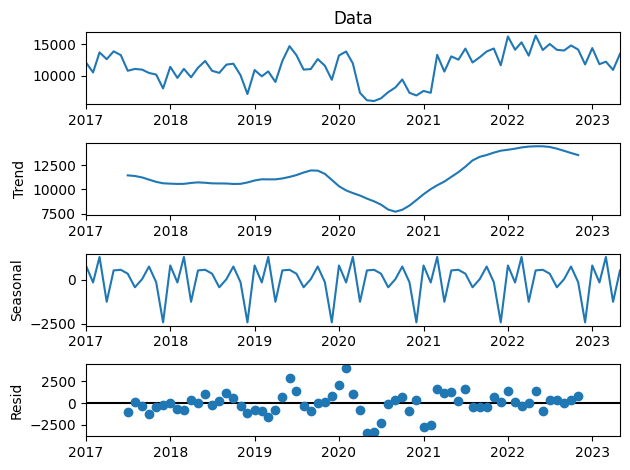

Multiplicative Decomposition


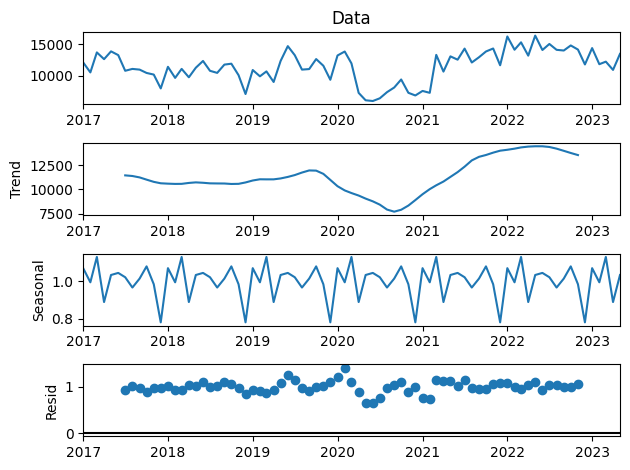

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



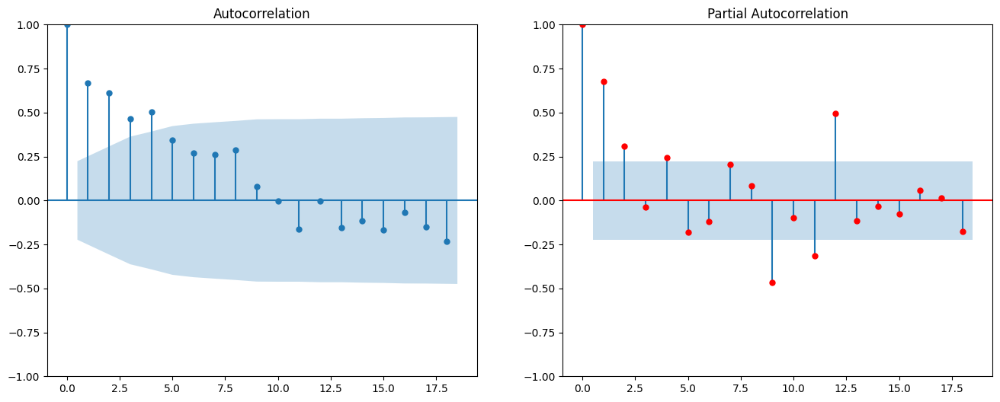

In [18]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf


for LSIP in groupcountry_df_t21_ts_c['Local Skills Improvement Plan'].unique():
    temporary_ts = groupcountry_df_t21_ts_c.copy()
    temporary_ts = temporary_ts[temporary_ts["Local Skills Improvement Plan"]== LSIP]
    temporary_ts.set_index('Date', inplace=True)
    temporary_ts.drop(columns='Local Skills Improvement Plan', inplace=True)

    print(f'Local Skills Improvement Plan: {LSIP}')
    print("----------------------------------------------------------")

    # Additive Decomposition (y = Trend + Seasonal + Residuals)


    ax1 = seasonal_decompose(temporary_ts['Data'], model='additive').plot()
    print("Additive Decomposition")
    plt.show()
    ax2 = seasonal_decompose(temporary_ts['Data'], model='multiplicative').plot()
    print("Multiplicative Decomposition")
    plt.show()




    fig, axes = plt.subplots(1,2, figsize=(16,6))

    plot_acf(temporary_ts['Data'], lags=18, ax=axes[0]);
    plot_pacf(temporary_ts['Data'], lags=18, ax=axes[1], color='r')
    plt.show()


## Exploratory: Modelling - ALL LSIP 

In [19]:
df_t21_ts.rename(columns = {"Local Skills Improvement Plan": "LSIP", "SOC 2 digit code": "SOC2", "SOC 2 digit label": "SOC2NAME"},inplace = True)

In [20]:
# Creatung OHE on LSIP:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output = False)

ohe.fit(df_t21_ts[['LSIP']])


df_t21_ts[ohe.get_feature_names_out()] = ohe.transform(df_t21_ts[["LSIP"]])

In [21]:
df_t21_ts.head()

,LSIP,SOC2,SOC2NAME,Date,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,...,LSIP_StokeonTrent and Staffordshire,LSIP_Swindon and Wiltshire,LSIP_Tees Valley,LSIP_Thames Valley Berkshire,LSIP_The Marches,LSIP_West Midlands and Warwickshire,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire
0,"Brighton and Hove, East Sussex, West Sussex",11,Corporate managers and directors,2017-01-01,850,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"Brighton and Hove, East Sussex, West Sussex",12,Other managers and proprietors,2017-01-01,670,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"Brighton and Hove, East Sussex, West Sussex",21,"Science, research, engineering and technology ...",2017-01-01,1795,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,"Brighton and Hove, East Sussex, West Sussex",22,Health professionals,2017-01-01,1220,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"Brighton and Hove, East Sussex, West Sussex",23,Teaching and other educational professionals,2017-01-01,675,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
# Creating COVID feature: From Feb-20 to Dec-20

df_t21_ts['covid'] = df_t21_ts['Date'].apply(lambda x: 1 if x.month >= 2 and x.year == 2020 and x.month <= 12 else 0)
df_t21_ts.head()

,LSIP,SOC2,SOC2NAME,Date,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,...,LSIP_Swindon and Wiltshire,LSIP_Tees Valley,LSIP_Thames Valley Berkshire,LSIP_The Marches,LSIP_West Midlands and Warwickshire,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid
0,"Brighton and Hove, East Sussex, West Sussex",11,Corporate managers and directors,2017-01-01,850,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,"Brighton and Hove, East Sussex, West Sussex",12,Other managers and proprietors,2017-01-01,670,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,"Brighton and Hove, East Sussex, West Sussex",21,"Science, research, engineering and technology ...",2017-01-01,1795,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,"Brighton and Hove, East Sussex, West Sussex",22,Health professionals,2017-01-01,1220,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,"Brighton and Hove, East Sussex, West Sussex",23,Teaching and other educational professionals,2017-01-01,675,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [23]:
df_t21_ts[df_t21_ts['covid'] == 1]["Date"].value_counts()

2020-02-01    988
2020-03-01    988
2020-04-01    988
2020-05-01    988
2020-06-01    988
2020-07-01    988
2020-08-01    988
2020-09-01    988
2020-10-01    988
2020-11-01    988
2020-12-01    988
Name: Date, dtype: int64

In [24]:
# Making Date the Index:
df_t21_ts.set_index('Date', inplace=True)
df_t21_ts.head()

,LSIP,SOC2,SOC2NAME,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,...,LSIP_Swindon and Wiltshire,LSIP_Tees Valley,LSIP_Thames Valley Berkshire,LSIP_The Marches,LSIP_West Midlands and Warwickshire,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",11,Corporate managers and directors,850,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",12,Other managers and proprietors,670,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",21,"Science, research, engineering and technology ...",1795,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",22,Health professionals,1220,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",23,Teaching and other educational professionals,675,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [25]:
# Dropping SOC2Name and Creating Copy in case needed later:
df_t21_ts_copy = df_t21_ts.copy()
df_t21_ts.drop(columns = ["SOC2NAME"], inplace=True)

In [26]:
# Creating Laggings for the model:
# Create laggings for the previous, the 2nd previous, and the third previous

In [27]:
df_t21.shape

(988, 80)

In [28]:
rows_per_month_LSIP = 988

In [29]:
# Creating Laggings for the model:
# Create laggings for the previous, the 2nd previous, and the third previous
df_t21_ts['Lag1'] = df_t21_ts['Data'].shift(1*rows_per_month_LSIP)
df_t21_ts['Lag2'] = df_t21_ts['Data'].shift(2*rows_per_month_LSIP)
df_t21_ts['Lag3'] = df_t21_ts['Data'].shift(3*rows_per_month_LSIP)
df_t21_ts['Lag12'] = df_t21_ts['Data'].shift(12*rows_per_month_LSIP)
df_t21_ts.head(rows_per_month_LSIP+5)

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West Midlands and Warwickshire,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",11,850,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",12,670,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",21,1795,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",22,1220,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",23,675,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-01,"Brighton and Hove, East Sussex, West Sussex",11,635,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,850.0,NaN,NaN,NaN
2017-02-01,"Brighton and Hove, East Sussex, West Sussex",12,515,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,670.0,NaN,NaN,NaN
2017-02-01,"Brighton and Hove, East Sussex, West Sussex",21,1430,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,1795.0,NaN,NaN,NaN


In [30]:
# Adding GDP Quarter Growth Data: GDP Data came from ONS --> Office of National Statistics
gdp = pd.read_csv('Data/gdp.csv')

# Split the 'Date' column into year and quarter
gdp[['Year', 'Quarter']] = gdp['Quarter'].str.split(' ', expand=True)

quarter_to_month = {'Q1': '01', 'Q2': '04', 'Q3': '07', 'Q4': '10'}
gdp['Month'] = gdp['Quarter'].map(quarter_to_month)
gdp['QInit'] = pd.to_datetime(gdp['Year'] + gdp['Month'], format='%Y%m')

# Drop the intermediate columns if not needed
gdp = gdp.drop(columns=['Year', 'Quarter', 'Month'])
gdp.head()


,GDP Qgrowth,QInit
0,0.6,2016-10-01
1,0.8,2017-01-01
2,0.6,2017-04-01
3,0.6,2017-07-01
4,0.7,2017-10-01


In [31]:
#Adding G4

df_t21_ts['GDPQGrowth'] = gdp.set_index('QInit')['GDP Qgrowth']
df_t21_ts['GDPLag1'] = df_t21_ts['GDPQGrowth'].shift(rows_per_month_LSIP*3) #3 months - Quarter
df_t21_ts.tail(rows_per_month_LSIP+4)

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPQGrowth,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2023-04-01,York and North Yorkshire,81,365,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,415.0,390.0,445.0,485.0,0.0,0.2
2023-04-01,York and North Yorkshire,82,310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,250.0,270.0,365.0,310.0,0.0,0.2
2023-04-01,York and North Yorkshire,91,185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,190.0,185.0,200.0,270.0,0.0,0.2
2023-04-01,York and North Yorkshire,92,1280,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,1335.0,1200.0,1380.0,1525.0,0.0,0.2
2023-05-01,"Brighton and Hove, East Sussex, West Sussex",11,970,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,900.0,910.0,970.0,1420.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,York and North Yorkshire,72,300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,235.0,250.0,235.0,385.0,NaN,NaN
2023-05-01,York and North Yorkshire,81,435,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,365.0,415.0,390.0,600.0,NaN,NaN
2023-05-01,York and North Yorkshire,82,425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,310.0,250.0,270.0,420.0,NaN,NaN


In [32]:
#Adding GDP for 01-01-2017 (From Q4 2016)
df_t21_ts.loc['2017-01-01', 'GDPLag1'] = 0.6

#Adding for months with no GDP data (The one on top)
df_t21_ts['GDPLag1'] = df_t21_ts['GDPLag1'].fillna(method='ffill')

#Dropping GDPQGrowth:
df_t21_ts.drop(columns = ["GDPQGrowth"], inplace=True)

In [33]:
#Checking that we have values every 3 months:

In [34]:
df_t21_ts["GDPLag1"].groupby("Date").mean()

Date
2017-01-01    0.6
2017-02-01    0.6
2017-03-01    0.6
2017-04-01    0.8
2017-05-01    0.8
             ... 
2023-01-01    0.1
2023-02-01    0.1
2023-03-01    0.1
2023-04-01    0.2
2023-05-01    0.2
Name: GDPLag1, Length: 77, dtype: float64

In [35]:
gdp

,GDP Qgrowth,QInit
0,0.6,2016-10-01
1,0.8,2017-01-01
2,0.6,2017-04-01
3,0.6,2017-07-01
4,0.7,2017-10-01
5,0.1,2018-01-01
6,0.2,2018-04-01
7,0.3,2018-07-01
8,0.1,2018-10-01
9,0.7,2019-01-01


In [36]:
fig = px.line(df_t21_ts["GDPLag1"].groupby("Date").mean(),title=f'QGrowthLag')
fig.add_scatter(x=gdp['QInit'], y=gdp['GDP Qgrowth'])
fig.update_layout(height=600, width=1600)
fig.show()

# Red Lines (gdp) has less points, The importance here is to check if they are following the trends after 3 months.

In [37]:
# Separating Train and Test - 85-15
train_size = 0.85
index = round(train_size * df_t21_ts.shape[0])-445 #-445 to get all LSIP until may 2022 for training

agg_ts_train = df_t21_ts.iloc[:index]
agg_ts_test = df_t21_ts.iloc[index:]

agg_ts_train.tail(10)

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2022-05-01,York and North Yorkshire,54,470,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,370.0,485.0,405.0,460.0,0.5
2022-05-01,York and North Yorkshire,61,1210,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,995.0,1160.0,1090.0,945.0,0.5
2022-05-01,York and North Yorkshire,62,265,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,230.0,235.0,245.0,170.0,0.5
2022-05-01,York and North Yorkshire,63,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,10.0,10.0,5.0,5.0,0.5
2022-05-01,York and North Yorkshire,71,615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,535.0,570.0,610.0,420.0,0.5
2022-05-01,York and North Yorkshire,72,385,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,315.0,365.0,285.0,240.0,0.5
2022-05-01,York and North Yorkshire,81,600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,485.0,600.0,535.0,530.0,0.5
2022-05-01,York and North Yorkshire,82,420,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,310.0,465.0,365.0,395.0,0.5
2022-05-01,York and North Yorkshire,91,255,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,270.0,315.0,285.0,240.0,0.5


In [38]:
# Separating X and y:
train_agg_X = agg_ts_train.drop(columns = ["Data"])
train_agg_y = agg_ts_train[["Data"]]
test_agg_X = agg_ts_test.drop(columns = ["Data"])
test_agg_y = agg_ts_test[["Data"]]

In [39]:
Date_Country = test_agg_X.copy()
Date_Country

,LSIP,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1420.0,1115.0,1375.0,945.0,0.5
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,900.0,790.0,985.0,755.0,0.5
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2480.0,1935.0,2585.0,1865.0,0.5
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2170.0,1855.0,2040.0,1845.0,0.5
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1250.0,1005.0,1155.0,755.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,York and North Yorkshire,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,235.0,250.0,235.0,385.0,0.2
2023-05-01,York and North Yorkshire,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,365.0,415.0,390.0,600.0,0.2
2023-05-01,York and North Yorkshire,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,310.0,250.0,270.0,420.0,0.2


In [40]:
#Dropping LSIP
train_agg_X.drop(columns='LSIP', inplace=True)
test_agg_X.drop(columns='LSIP', inplace=True)

In [41]:
# Checking that is same shapes
test_agg_X.shape, test_agg_y.shape

((11856, 45), (11856, 1))

In [42]:
test_agg_X.head()

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1420.0,1115.0,1375.0,945.0,0.5
2022-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,900.0,790.0,985.0,755.0,0.5
2022-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2480.0,1935.0,2585.0,1865.0,0.5
2022-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2170.0,1855.0,2040.0,1845.0,0.5
2022-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1250.0,1005.0,1155.0,755.0,0.5


### Modelling: XGBooster

In [43]:
def rmspe(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred)) / np.mean(y_true)

In [44]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

In [45]:
basemodel= XGBRegressor(random_state = 1, n_jobs=-1).fit(train_agg_X, train_agg_y)

#Predictions
predict_train= np.round(basemodel.predict(train_agg_X))
predict_val= basemodel.predict(test_agg_X)
predict_val= np.round(predict_val)

#RMSPE
rmse_trainb=rmspe(train_agg_y, predict_train)
rmse_valb=rmspe(test_agg_y, predict_val)

print(f"Training Error: {rmse_trainb} \nValidation Error: {rmse_valb}")

Training Error: Data    0.17811
dtype: float64 
Validation Error: Data    0.330377
dtype: float64


/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'



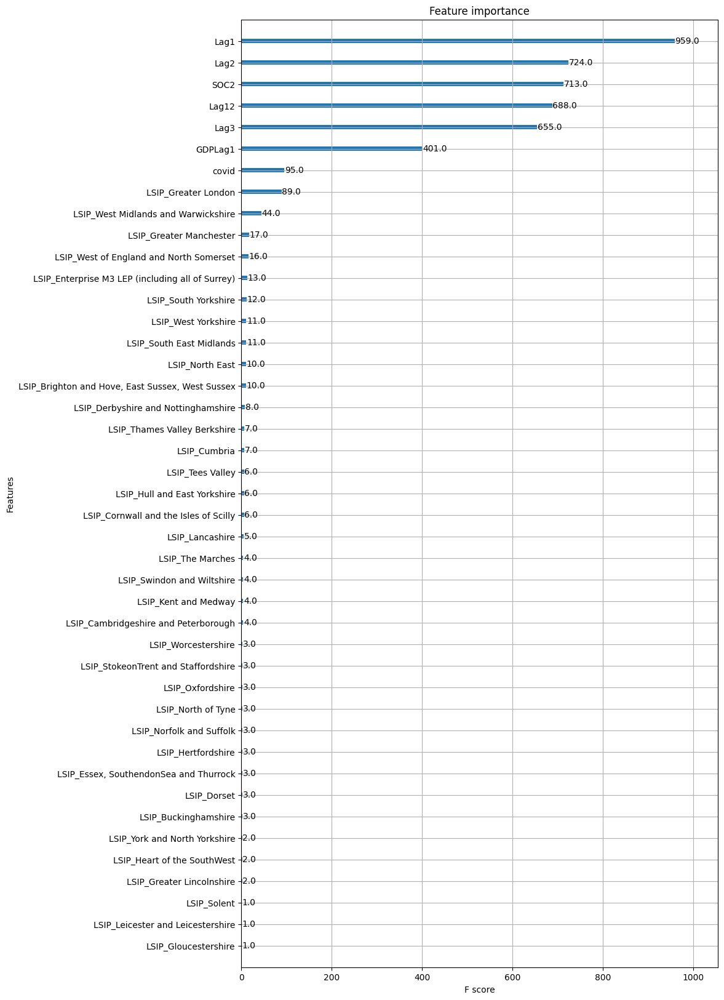

In [46]:
from xgboost import plot_importance
fig, ax = plt.subplots(figsize=(10, 20))
plot_importance(basemodel, ax=ax)
plt.show()

##### Results without Laggings (Assuming Predictions as true values):


In [47]:
test_agg_X2 = test_agg_X.copy()
test_agg_X2.loc["2022-06-01"]

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1420.0,1115.0,1375.0,945.0,0.5
2022-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,900.0,790.0,985.0,755.0,0.5
2022-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2480.0,1935.0,2585.0,1865.0,0.5
2022-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,2170.0,1855.0,2040.0,1845.0,0.5
2022-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1250.0,1005.0,1155.0,755.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,385.0,315.0,365.0,305.0,0.5
2022-06-01,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,600.0,485.0,600.0,480.0,0.5
2022-06-01,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,420.0,310.0,465.0,375.0,0.5


In [48]:
total_months_predict = 12

In [49]:
rows_per_month = 988

In [50]:
test_agg_X2["Prediction"] = -9999
test_agg_X2.head()

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Prediction
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1420.0,1115.0,1375.0,945.0,0.5,-9999
2022-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,900.0,790.0,985.0,755.0,0.5,-9999
2022-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2480.0,1935.0,2585.0,1865.0,0.5,-9999
2022-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2170.0,1855.0,2040.0,1845.0,0.5,-9999
2022-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1250.0,1005.0,1155.0,755.0,0.5,-9999


In [51]:
for x in range(1, total_months_predict + 1):

    df_tmp = test_agg_X2.iloc[(x-1)*rows_per_month:x*rows_per_month]
    df_tmp.drop(columns = "Prediction", inplace = True)
    
    predict_val_2= np.round(basemodel.predict(df_tmp)).tolist()
    
    #Changing predictions on test_agg_X2
    test_agg_X2.loc[(x-1)*rows_per_month:x*rows_per_month, "Prediction"] = predict_val_2
    
    #Changing Lags with predictions on test_agg_X2
    if x+11 < total_months_predict:
        test_agg_X2.loc[x*rows_per_month:x*rows_per_month+rows_per_month, "Lag1"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month:x*rows_per_month+rows_per_month * 2, "Lag2"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month * 2:x*rows_per_month+rows_per_month * 3, "Lag3"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month * 11:x*rows_per_month+rows_per_month * 12, "Lag12"] = predict_val_2
    
    elif x+2 < total_months_predict:
        test_agg_X2.loc[x*rows_per_month:x*rows_per_month+rows_per_month, "Lag1"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month:x*rows_per_month+rows_per_month * 2, "Lag2"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month * 2:x*rows_per_month+rows_per_month * 3, "Lag3"] = predict_val_2
    
    elif x+1 < total_months_predict:
        test_agg_X2.loc[x*rows_per_month:x*rows_per_month+rows_per_month, "Lag1"] = predict_val_2
        test_agg_X2.loc[x*rows_per_month+rows_per_month:x*rows_per_month+rows_per_month * 2, "Lag2"] = predict_val_2
        
    elif x < total_months_predict:
        test_agg_X2.loc[x*rows_per_month:x*rows_per_month+rows_per_month, "Lag1"] = predict_val_2
    
    

/tmp/ipykernel_140572/398479920.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_140572/398479920.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/398479920.py:19: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/398479920.py:20: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/398479920.py:21: FutureWarning:

Slicing a positional slice with .loc is

In [52]:
test_agg_X2.head(rows_per_month+4)

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Prediction
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1420.0,1115.0,1375.0,945.0,0.5,1192.0
2022-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,900.0,790.0,985.0,755.0,0.5,858.0
2022-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2480.0,1935.0,2585.0,1865.0,0.5,2278.0
2022-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2170.0,1855.0,2040.0,1845.0,0.5,1963.0
2022-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1250.0,1005.0,1155.0,755.0,0.5,1035.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01,92,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,1685.0,1525.0,1665.0,1290.0,0.5,1542.0
2022-07-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1192.0,1420.0,1115.0,1090.0,0.1,1234.0
2022-07-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,858.0,900.0,790.0,810.0,0.1,856.0


In [53]:
rmse_valb_2=rmspe(test_agg_y, test_agg_X2["Prediction"])

print(f"Training Error: {rmse_trainb} \nValidation Error: {rmse_valb} \nValidation Error / WithOut Data Leakage: {rmse_valb_2}")

Training Error: Data    0.17811
dtype: float64 
Validation Error: Data    0.330377
dtype: float64 
Validation Error / WithOut Data Leakage: Data    0.402428
dtype: float64


/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'



### Checking Results:

##### Results:

In [54]:
predicted_df = pd.DataFrame({'Value': predict_val, "LSIP": Date_Country.LSIP.values,"SOC2": Date_Country["SOC2"].values, "Type": "Predicted"}, index=test_agg_X.index)
actual_df = pd.DataFrame({'Value': test_agg_y["Data"].values, "LSIP": Date_Country.LSIP.values,"SOC2": Date_Country["SOC2"].values, "Type": "Actual"}, index=test_agg_X.index)
predicted_df2 = pd.DataFrame({'Value': test_agg_X2.Prediction.values,"LSIP": Date_Country.LSIP.values,"SOC2": Date_Country["SOC2"].values,  "Type": "Predicted/WDL"}, index=test_agg_X.index)

predicted_df.shape, actual_df.shape , predicted_df2.shape,

((11856, 4), (11856, 4), (11856, 4))

In [55]:
predicted_df

,Value,LSIP,SOC2,Type
Date,,,,
2022-06-01,1192.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted
2022-06-01,858.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted
2022-06-01,2278.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted
2022-06-01,1963.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted
2022-06-01,1035.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted
...,...,...,...,...
2023-05-01,268.0,York and North Yorkshire,72,Predicted
2023-05-01,415.0,York and North Yorkshire,81,Predicted
2023-05-01,321.0,York and North Yorkshire,82,Predicted


In [56]:
predicted_df2

,Value,LSIP,SOC2,Type
Date,,,,
2022-06-01,1192.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted/WDL
2022-06-01,858.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted/WDL
2022-06-01,2278.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted/WDL
2022-06-01,1963.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted/WDL
2022-06-01,1035.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted/WDL
...,...,...,...,...
2023-05-01,361.0,York and North Yorkshire,72,Predicted/WDL
2023-05-01,519.0,York and North Yorkshire,81,Predicted/WDL
2023-05-01,426.0,York and North Yorkshire,82,Predicted/WDL


In [57]:
actual_df

,Value,LSIP,SOC2,Type
Date,,,,
2022-06-01,1230,"Brighton and Hove, East Sussex, West Sussex",11,Actual
2022-06-01,890,"Brighton and Hove, East Sussex, West Sussex",12,Actual
2022-06-01,2150,"Brighton and Hove, East Sussex, West Sussex",21,Actual
2022-06-01,1890,"Brighton and Hove, East Sussex, West Sussex",22,Actual
2022-06-01,1055,"Brighton and Hove, East Sussex, West Sussex",23,Actual
...,...,...,...,...
2023-05-01,300,York and North Yorkshire,72,Actual
2023-05-01,435,York and North Yorkshire,81,Actual
2023-05-01,425,York and North Yorkshire,82,Actual


In [58]:
group_df= pd.concat([actual_df, predicted_df], axis=0)
#group_df = pd.concat([group_df, predicted_df2], axis=0)
group_df

,Value,LSIP,SOC2,Type
Date,,,,
2022-06-01,1230.0,"Brighton and Hove, East Sussex, West Sussex",11,Actual
2022-06-01,890.0,"Brighton and Hove, East Sussex, West Sussex",12,Actual
2022-06-01,2150.0,"Brighton and Hove, East Sussex, West Sussex",21,Actual
2022-06-01,1890.0,"Brighton and Hove, East Sussex, West Sussex",22,Actual
2022-06-01,1055.0,"Brighton and Hove, East Sussex, West Sussex",23,Actual
...,...,...,...,...
2023-05-01,268.0,York and North Yorkshire,72,Predicted
2023-05-01,415.0,York and North Yorkshire,81,Predicted
2023-05-01,321.0,York and North Yorkshire,82,Predicted


#### Results by SOC2:

In [59]:
group_df_2= group_df.groupby(["Date","SOC2","Type"])["Value"].sum().reset_index()

##### All SOC2 - All LSIP

In [60]:
fig = px.line(group_df_2, x="Date", y='Value', line_dash='Type' ,color = "SOC2"
              ,title=f'Total ADS by SOC2 - ALL LSIP')
fig.update_layout(height=600, width=1600)
fig.show()

#### SOC2 - All LSIP


In [61]:
check_soc2 = 22

In [62]:
fig = px.line(group_df_2[group_df_2["SOC2"] == check_soc2], x="Date", y='Value', line_dash='Type' ,color = "SOC2"
              ,title=f'Total ADS by SOC2 - ALL LSIP')
fig.update_layout(height=600, width=1600)
fig.show()

#### RESULTS BY LSIP:

In [63]:
group_df

,Value,LSIP,SOC2,Type
Date,,,,
2022-06-01,1230.0,"Brighton and Hove, East Sussex, West Sussex",11,Actual
2022-06-01,890.0,"Brighton and Hove, East Sussex, West Sussex",12,Actual
2022-06-01,2150.0,"Brighton and Hove, East Sussex, West Sussex",21,Actual
2022-06-01,1890.0,"Brighton and Hove, East Sussex, West Sussex",22,Actual
2022-06-01,1055.0,"Brighton and Hove, East Sussex, West Sussex",23,Actual
...,...,...,...,...
2023-05-01,268.0,York and North Yorkshire,72,Predicted
2023-05-01,415.0,York and North Yorkshire,81,Predicted
2023-05-01,321.0,York and North Yorkshire,82,Predicted


In [64]:
group_df_3= group_df.groupby(["Date","SOC2","LSIP","Type"])["Value"].sum().reset_index()

In [65]:
check_lsip = "Greater Manchester"

In [66]:
fig = px.line(group_df_3[group_df_3["LSIP"] == f'{check_lsip}'], x="Date", y='Value', line_dash='Type', color = "SOC2" ,title=f'Total ADS by SOC2 - {check_lsip}')
fig.update_layout(height=600, width=1600)
fig.show()

## Modelling All LSIP - ALL SOC2

In [67]:
# Assumptions: Same Assumptions than 2.2.2

### Creating New Dataset: Predictions

In [68]:
df_t21_ts.head(2)

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",11,850,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
2017-01-01,"Brighton and Hove, East Sussex, West Sussex",12,670,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6


In [69]:
df_t21_ts_predict = df_t21_ts.copy()
df_t21_ts_predict["Training"] = 1
df_t21_ts_predict.tail(1)

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-01,York and North Yorkshire,92,1505,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,1280.0,1335.0,1200.0,1685.0,0.2,1


In [70]:
# Creating Prediction dataset
prediction_data = df_t21_ts.loc['2017-06-01':'2019-12-01'].copy()
prediction_data.index = prediction_data.index + pd.DateOffset(years=6)
prediction_data['covid'] = 0
prediction_data['Lag1'] = -9999
prediction_data['Lag2'] = -9999
prediction_data['Lag3'] = -9999
prediction_data['Lag12'] = -9999
prediction_data['GDPLag1'] = -9999
prediction_data['Data'] = np.NaN
prediction_data['Training'] = 0
prediction_data

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,-9999,-9999,-9999,-9999,-9999,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,-9999,-9999,-9999,-9999,-9999,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,-9999,-9999,-9999,-9999,-9999,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,-9999,-9999,-9999,-9999,-9999,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,-9999,-9999,-9999,-9999,-9999,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-01,York and North Yorkshire,72,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,-9999,-9999,-9999,-9999,-9999,0
2025-12-01,York and North Yorkshire,81,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,-9999,-9999,-9999,-9999,-9999,0
2025-12-01,York and North Yorkshire,82,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,-9999,-9999,-9999,-9999,-9999,0


In [71]:
#Joining with last 12 months Time Series to Create Laggings:

In [72]:
predict_temp = df_t21_ts_predict.tail(rows_per_month_LSIP * 12).append(prediction_data)
predict_temp['Lag1'] = predict_temp['Data'].shift(1*rows_per_month_LSIP)
predict_temp['Lag2'] = predict_temp['Data'].shift(2*rows_per_month_LSIP)
predict_temp['Lag3'] = predict_temp['Data'].shift(3*rows_per_month_LSIP)
predict_temp['Lag12'] = predict_temp['Data'].shift(12*rows_per_month_LSIP)

/tmp/ipykernel_140572/510370746.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [73]:
predict_temp.loc["2022-06-01"] ## Data from this period should be equal to Lag12 from 2023-06-01 period

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",11,1230.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",12,890.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",21,2150.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",22,1890.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,"Brighton and Hove, East Sussex, West Sussex",23,1055.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01,York and North Yorkshire,72,315.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,York and North Yorkshire,81,490.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.5,1
2022-06-01,York and North Yorkshire,82,385.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.5,1


In [74]:
predict_temp.loc["2023-06-01"] ## Lag12 from this period should be equal to Data from 2022-06-01 period

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,-9999.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01,York and North Yorkshire,72,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,300.0,235.0,250.0,315.0,-9999.0,0
2023-06-01,York and North Yorkshire,81,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,435.0,365.0,415.0,490.0,-9999.0,0
2023-06-01,York and North Yorkshire,82,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,425.0,310.0,250.0,385.0,-9999.0,0


In [75]:
#Filtering data with Training == 0 (Prediction dataset)
prediction_data = predict_temp[predict_temp["Training"] == 0]
prediction_data.head()

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,-9999.0,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,-9999.0,0


In [76]:
# Adding GDP LAG-1 to prediciton data:
prediction_data_2= prediction_data.copy() #Making a copy JIC

In [77]:
# Seeded from random to compare results:
gdp_dict = {'2023-04-01': 0,
 '2023-07-01': -0.1,
 '2023-10-01': -0.3,
 '2024-01-01': 0.17,
 '2024-04-01': 0.13,
 '2024-07-01': 0.2,
 '2024-10-01': 0.18,
 '2025-01-01': 0.45,
 '2025-04-01': 0.43,
 '2025-07-01': 0.42,
 '2025-10-01': 0.39}

In [78]:
gdp_pred = pd.DataFrame(gdp_dict.items())
gdp_pred = gdp_pred.rename(columns={0: "Date",1: "Gdp_growth"})
gdp_pred['Date'] = pd.to_datetime(gdp_pred['Date'])
gdp_pred

,Date,Gdp_growth
0,2023-04-01,0.00
1,2023-07-01,-0.10
2,2023-10-01,-0.30
3,2024-01-01,0.17
4,2024-04-01,0.13
5,2024-07-01,0.20
6,2024-10-01,0.18
7,2025-01-01,0.45
8,2025-04-01,0.43
9,2025-07-01,0.42


In [79]:
prediction_data_2['GDPQGrowth'] = gdp_pred.set_index('Date')['Gdp_growth']
prediction_data_2['GDPLag1'] = prediction_data_2['GDPQGrowth'].shift(rows_per_month_LSIP*3)
prediction_data_2.loc['2023-06-01', 'GDPLag1'] = 0.2
prediction_data_2.loc['2023-07-01', 'GDPLag1'] = 0

In [80]:
## If the Lagging work properly: 2025-10-01 GDPLag1 == 2025-07-01 gdp_pred
prediction_data_2.loc['2025-10-01']

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training,GDPQGrowth
Date,,,,,,,,,,,,,,,,,,,,,
2025-10-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-01,York and North Yorkshire,72,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,York and North Yorkshire,81,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39
2025-10-01,York and North Yorkshire,82,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0,0.39


In [81]:
gdp_pred ## It's working!

,Date,Gdp_growth
0,2023-04-01,0.00
1,2023-07-01,-0.10
2,2023-10-01,-0.30
3,2024-01-01,0.17
4,2024-04-01,0.13
5,2024-07-01,0.20
6,2024-10-01,0.18
7,2025-01-01,0.45
8,2025-04-01,0.43
9,2025-07-01,0.42


In [82]:
#Adding for months with no GDP data (The one on top)
prediction_data_2['GDPLag1'] = prediction_data_2['GDPLag1'].fillna(method='ffill')

#Dropping GDPQGrowth:
prediction_data_2.drop(columns = ["GDPQGrowth"], inplace=True)
prediction_data_2.head()

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,0.2,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,0.2,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,0.2,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,0.2,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,0.2,0


In [83]:
prediction_data = prediction_data_2
prediction_data

,LSIP,SOC2,Data,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Training
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",11,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,0.20,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",12,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,0.20,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",21,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,0.20,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",22,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,0.20,0
2023-06-01,"Brighton and Hove, East Sussex, West Sussex",23,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,0.20,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-01,York and North Yorkshire,72,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0
2025-12-01,York and North Yorkshire,81,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0
2025-12-01,York and North Yorkshire,82,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42,0


### Training Model with all the Dataset:

In [84]:
train_agg_X = df_t21_ts_predict.drop(columns = ["Data", "Training","LSIP"])
train_agg_y = df_t21_ts_predict[["Data"]]
train_agg_X

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
2017-01-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
2017-01-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
2017-01-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
2017-01-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-01,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,235.0,250.0,235.0,385.0,0.2
2023-05-01,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,365.0,415.0,390.0,600.0,0.2
2023-05-01,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,310.0,250.0,270.0,420.0,0.2


In [85]:
assert train_agg_X.shape[0] == train_agg_y.shape[0]

In [86]:
test_agg_X = prediction_data.drop(columns = ["Data","Training","LSIP"])
test_agg_X

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,0.20
2023-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,0.20
2023-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,0.20
2023-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,0.20
2023-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,0.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-01,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42
2025-12-01,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42
2025-12-01,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42


In [87]:
basemodel= XGBRegressor(n_jobs=-1).fit(train_agg_X, train_agg_y)

predict_train= np.round(basemodel.predict(train_agg_X))

rmse_trainb=rmspe(train_agg_y, predict_train)

print(f"Training Error: {rmse_trainb}")

Training Error: Data    0.190497
dtype: float64


/home/tgarciar/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'



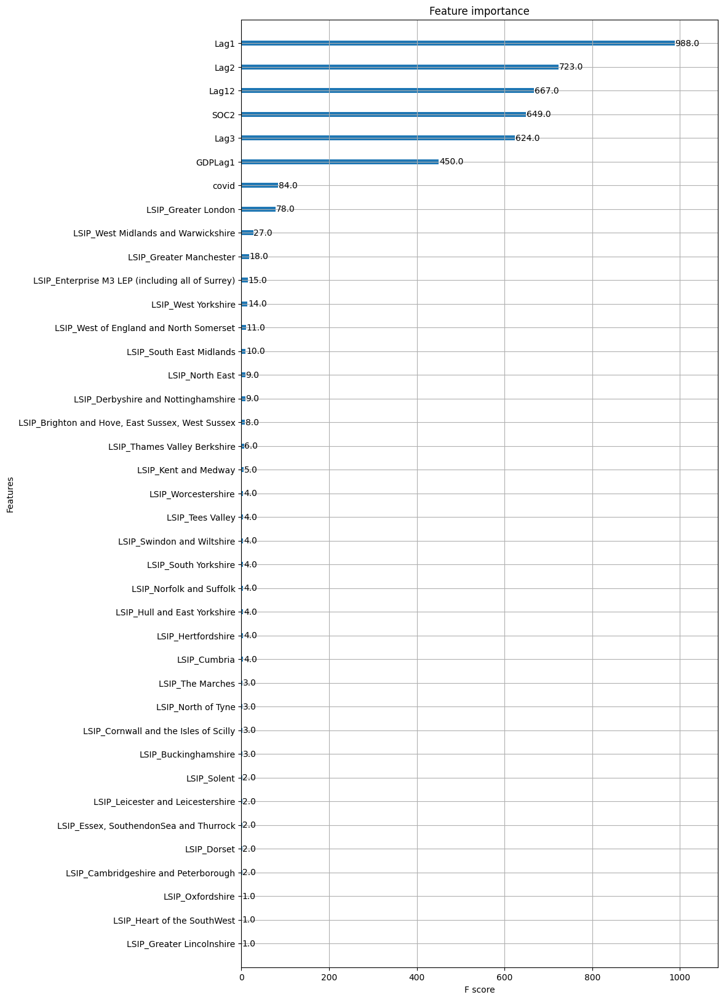

In [88]:
fig, ax = plt.subplots(figsize=(10, 20))
plot_importance(basemodel, ax=ax)
plt.show()

In [89]:
predicted_df = pd.DataFrame({'Value': predict_train, "LSIP": df_t21_ts_predict.LSIP.values,"SOC2": df_t21_ts_predict["SOC2"].values, "Type": "Predicted"}, index=train_agg_X.index)
actual_df = pd.DataFrame({'Value': train_agg_y["Data"].values, "LSIP": df_t21_ts_predict.LSIP.values,"SOC2": df_t21_ts_predict["SOC2"].values, "Type": "Actual"}, index=train_agg_X.index)
predicted_df.shape, actual_df.shape

((76076, 4), (76076, 4))

In [90]:
group_df = pd.concat([actual_df, predicted_df], axis=0)
group_df

,Value,LSIP,SOC2,Type
Date,,,,
2017-01-01,850.0,"Brighton and Hove, East Sussex, West Sussex",11,Actual
2017-01-01,670.0,"Brighton and Hove, East Sussex, West Sussex",12,Actual
2017-01-01,1795.0,"Brighton and Hove, East Sussex, West Sussex",21,Actual
2017-01-01,1220.0,"Brighton and Hove, East Sussex, West Sussex",22,Actual
2017-01-01,675.0,"Brighton and Hove, East Sussex, West Sussex",23,Actual
...,...,...,...,...
2023-05-01,278.0,York and North Yorkshire,72,Predicted
2023-05-01,417.0,York and North Yorkshire,81,Predicted
2023-05-01,312.0,York and North Yorkshire,82,Predicted


### Results - Plot: Training Dataset

In [91]:
group_df_2_LSIP= group_df.groupby(["Date","LSIP","Type"])["Value"].sum().reset_index()

In [92]:
group_df_2= group_df.groupby(["Date","SOC2","Type"])["Value"].sum().reset_index()

In [93]:
fig = px.line(group_df_2, x="Date", y='Value', line_dash='Type', color = "SOC2" ,title=f'Total ADS by SOC2 - ALL LSIP')
fig.update_layout(height=600, width=1000)
fig.show()

### Prediction:

Because we use laggings, we will predict month by month, refresh the laggings and assume that the prediction is good.

In [94]:
test_agg_X2 = test_agg_X.copy() # Dataset with all the months to predict

In [95]:
test_agg_X.head()

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,0.2
2023-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,0.2
2023-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,0.2
2023-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,0.2
2023-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,0.2


In [96]:
rows_per_month_LSIP

988

In [97]:
total_months_predict= int(test_agg_X.shape[0]/(rows_per_month_LSIP))
total_months_predict

31

In [98]:
test_agg_X = prediction_data.drop(columns = ["Data","Training","LSIP"])
test_agg_X

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West Yorkshire,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1
Date,,,,,,,,,,,,,,,,,,,,,
2023-06-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,970.0,900.0,910.0,1230.0,0.20
2023-06-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,745.0,645.0,675.0,890.0,0.20
2023-06-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1415.0,1510.0,1790.0,2150.0,0.20
2023-06-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1970.0,2145.0,2175.0,1890.0,0.20
2023-06-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1330.0,1210.0,1270.0,1055.0,0.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-01,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42
2025-12-01,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42
2025-12-01,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0,NaN,NaN,NaN,NaN,0.42


In [99]:
# Adding the logic of the Lags! Refreshing them every time

In [100]:
test_agg_X["Prediction"] = -9999
#test_agg_X.iloc[1*988:2*988]

In [101]:
for x in range(1, total_months_predict + 1):

    df_tmp = test_agg_X.iloc[(x-1)*rows_per_month_LSIP:x*rows_per_month_LSIP]
    df_tmp.drop(columns = "Prediction", inplace = True)
    
    predict_val= np.round(basemodel.predict(df_tmp)).tolist()
    
    #Changing predictions on test_agg_X
    test_agg_X.loc[(x-1)*rows_per_month_LSIP:x*rows_per_month_LSIP, "Prediction"] = predict_val
    
    #Changing Lags with predictions on test_agg_X
    if x+11 < total_months_predict:
        test_agg_X.loc[x*rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP, "Lag1"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP * 2, "Lag2"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP * 2:x*rows_per_month_LSIP+rows_per_month_LSIP * 3, "Lag3"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP * 11:x*rows_per_month_LSIP+rows_per_month_LSIP * 12, "Lag12"] = predict_val
    
    elif x+2 < total_months_predict:
        test_agg_X.loc[x*rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP, "Lag1"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP * 2, "Lag2"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP * 2:x*rows_per_month_LSIP+rows_per_month_LSIP * 3, "Lag3"] = predict_val
    
    elif x+1 < total_months_predict:
        test_agg_X.loc[x*rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP, "Lag1"] = predict_val
        test_agg_X.loc[x*rows_per_month_LSIP+rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP * 2, "Lag2"] = predict_val
        
    elif x < total_months_predict:
        test_agg_X.loc[x*rows_per_month_LSIP:x*rows_per_month_LSIP+rows_per_month_LSIP, "Lag1"] = predict_val
    
    

/tmp/ipykernel_140572/2313268080.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_140572/2313268080.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:13: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:14: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:15: FutureWarning:

Slicing a positional slice with .l

/tmp/ipykernel_140572/2313268080.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:13: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:14: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:15: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:16: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future v

/tmp/ipykernel_140572/2313268080.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:13: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:14: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:15: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:16: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future v

/tmp/ipykernel_140572/2313268080.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:28: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.

/tmp/ipykernel_140572/2313268080.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_140572/2313268080.py:9: FutureWarning:

Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.



In [102]:
# At the Beggining
prediction_06_23 = test_agg_X.loc["2023-06-01"]["Prediction"].values
Lag1_07_23 = test_agg_X.loc["2023-07-01"]["Lag1"].values
Lag2_08_23 = test_agg_X.loc["2023-08-01"]["Lag2"].values
Lag3_09_23 = test_agg_X.loc["2023-09-01"]["Lag3"].values
Lag12_06_24 = test_agg_X.loc["2024-06-01"]["Lag12"].values


are_equal = np.array_equal(prediction_06_23, Lag1_07_23)
are_equal2 = np.array_equal(prediction_06_23, Lag2_08_23)
are_equal3 = np.array_equal(prediction_06_23, Lag3_09_23)
are_equal12 = np.array_equal(prediction_06_23, Lag12_06_24)
assert (are_equal * are_equal2 * are_equal3 * are_equal12)

In [103]:
# In the middle:
prediction_08_24 = test_agg_X.loc["2024-08-01"]["Prediction"].values
Lag1_09_24 = test_agg_X.loc["2024-09-01"]["Lag1"].values
Lag2_10_24 = test_agg_X.loc["2024-10-01"]["Lag2"].values
Lag3_11_24 = test_agg_X.loc["2024-11-01"]["Lag3"].values
Lag12_08_25 = test_agg_X.loc["2025-08-01"]["Lag12"].values


are_equal = np.array_equal(prediction_08_24, Lag1_09_24)
are_equal2 = np.array_equal(prediction_08_24, Lag2_10_24)
are_equal3 = np.array_equal(prediction_08_24, Lag3_11_24)
are_equal12 = np.array_equal(prediction_08_24, Lag12_08_25)
assert (are_equal * are_equal2 * are_equal3 * are_equal12)

In [104]:
# At the end:
prediction_11_25 = test_agg_X.loc["2025-11-01"]["Prediction"].values
prediction_10_25 = test_agg_X.loc["2025-10-01"]["Prediction"].values
prediction_09_25 = test_agg_X.loc["2025-09-01"]["Prediction"].values
prediction_12_24 = test_agg_X.loc["2024-12-01"]["Prediction"].values
Lag12_12_25 = test_agg_X.loc["2025-12-01"]["Lag12"].values
Lag3_11_25 = test_agg_X.loc["2025-12-01"]["Lag3"].values
Lag2_12_25 = test_agg_X.loc["2025-12-01"]["Lag2"].values
Lag1_12_25 = test_agg_X.loc["2025-12-01"]["Lag1"].values

are_equal = np.array_equal(prediction_11_25, Lag1_12_25)
are_equal2 = np.array_equal(prediction_10_25, Lag2_12_25)
are_equal3 = np.array_equal(prediction_09_25, Lag3_11_25)
are_equal12 = np.array_equal(prediction_12_24, Lag12_12_25)
assert are_equal * are_equal2 * are_equal3 *  are_equal12

In [105]:
test_agg_X.loc["2025-12-01"]

,SOC2,"LSIP_Brighton and Hove, East Sussex, West Sussex",LSIP_Buckinghamshire,LSIP_Cambridgeshire and Peterborough,LSIP_Cheshire and Warrington,LSIP_Cornwall and the Isles of Scilly,LSIP_Cumbria,LSIP_Derbyshire and Nottinghamshire,LSIP_Dorset,LSIP_Enterprise M3 LEP (including all of Surrey),...,LSIP_West of England and North Somerset,LSIP_Worcestershire,LSIP_York and North Yorkshire,covid,Lag1,Lag2,Lag3,Lag12,GDPLag1,Prediction
Date,,,,,,,,,,,,,,,,,,,,,
2025-12-01,11,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1162.0,1162.0,1162.0,1115.0,0.42,1147.0
2025-12-01,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,934.0,888.0,888.0,805.0,0.42,922.0
2025-12-01,21,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2172.0,2202.0,2185.0,1997.0,0.42,2177.0
2025-12-01,22,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,2397.0,2358.0,2308.0,2055.0,0.42,2397.0
2025-12-01,23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0,1488.0,1471.0,1411.0,1324.0,0.42,1527.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-01,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,246.0,236.0,228.0,248.0,0.42,246.0
2025-12-01,81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,411.0,417.0,425.0,371.0,0.42,391.0
2025-12-01,82,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0,304.0,304.0,298.0,317.0,0.42,319.0


### Results Plots:

In [106]:
predicted_df_2 = pd.DataFrame({'Value': test_agg_X.Prediction, "LSIP": prediction_data.LSIP.values,"SOC2": prediction_data["SOC2"].values, "Type": "Predicted"}, index=test_agg_X.index)
predicted_df_2

,Value,LSIP,SOC2,Type
Date,,,,
2023-06-01,1025.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted
2023-06-01,726.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted
2023-06-01,1646.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted
2023-06-01,1928.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted
2023-06-01,1197.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted
...,...,...,...,...
2025-12-01,246.0,York and North Yorkshire,72,Predicted
2025-12-01,391.0,York and North Yorkshire,81,Predicted
2025-12-01,319.0,York and North Yorkshire,82,Predicted


#### Results by SOC 2:

In [107]:
group_df_2_pdf_2= predicted_df_2.groupby(["Date","SOC2","Type"])["Value"].sum().reset_index()

In [108]:
fig = px.line(group_df_2_pdf_2, x="Date", y='Value', line_dash='Type', color = "SOC2" ,title=f'Total ADS by SOC2 - ALL LSIP')
fig.update_layout(height=600, width=1600)
fig.show()

#### Plot: Training + Prediction

In [109]:
# Joining results from training with the predictions:

plot_TPred = group_df_2.append(group_df_2_pdf_2)
plot_TPred

/tmp/ipykernel_140572/2181408557.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Date,SOC2,Type,Value
0,2017-01-01,11,Actual,42480.0
1,2017-01-01,11,Predicted,43632.0
2,2017-01-01,12,Actual,25740.0
3,2017-01-01,12,Predicted,31024.0
4,2017-01-01,21,Actual,96405.0
...,...,...,...,...
801,2025-12-01,72,Predicted,16943.0
802,2025-12-01,81,Predicted,24718.0
803,2025-12-01,82,Predicted,22319.0
804,2025-12-01,91,Predicted,8540.0


In [110]:
fig = px.line(plot_TPred, x="Date", y='Value', line_dash='Type', color = "SOC2" ,title=f'Total ADS by SOC2 - ALL LSIP')
fig.update_layout(height=600, width=1600)
fig.show()

In [111]:
#Plotting all LSIP Growing (ALL SOC 2:)

In [112]:
group_df_2_LSIP_2= predicted_df_2.groupby(["Date","LSIP","Type"])["Value"].sum().reset_index()

In [113]:
plot_TPred_LSIP = group_df_2_LSIP.append(group_df_2_LSIP_2)
plot_TPred_LSIP

/tmp/ipykernel_140572/2618219641.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Date,LSIP,Type,Value
0,2017-01-01,"Brighton and Hove, East Sussex, West Sussex",Actual,20010.0
1,2017-01-01,"Brighton and Hove, East Sussex, West Sussex",Predicted,18456.0
2,2017-01-01,Buckinghamshire,Actual,7365.0
3,2017-01-01,Buckinghamshire,Predicted,10047.0
4,2017-01-01,Cambridgeshire and Peterborough,Actual,18920.0
...,...,...,...,...
1173,2025-12-01,West Midlands and Warwickshire,Predicted,51333.0
1174,2025-12-01,West Yorkshire,Predicted,31064.0
1175,2025-12-01,West of England and North Somerset,Predicted,24889.0
1176,2025-12-01,Worcestershire,Predicted,7616.0


In [114]:
fig = px.line(plot_TPred_LSIP, x="Date", y='Value', line_dash='Type', color = "LSIP" ,title=f'Total ADS by LSIP - ALL SOC')
fig.update_layout(height=600, width=1600)
fig.show()

#### Results by SOC2: 

In [115]:
predicted_df_2

,Value,LSIP,SOC2,Type
Date,,,,
2023-06-01,1025.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted
2023-06-01,726.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted
2023-06-01,1646.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted
2023-06-01,1928.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted
2023-06-01,1197.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted
...,...,...,...,...
2025-12-01,246.0,York and North Yorkshire,72,Predicted
2025-12-01,391.0,York and North Yorkshire,81,Predicted
2025-12-01,319.0,York and North Yorkshire,82,Predicted


In [116]:
soc2 = 21

In [117]:
plt_2soc = plot_TPred[(plot_TPred['SOC2'] == soc2)]
plt_2soc.head()

,Date,SOC2,Type,Value
4,2017-01-01,21,Actual,96405.0
5,2017-01-01,21,Predicted,83014.0
56,2017-02-01,21,Actual,76785.0
57,2017-02-01,21,Predicted,77434.0
108,2017-03-01,21,Actual,93320.0


In [118]:
fig = px.line(plt_2soc.groupby(["Date","Type"])["Value"].sum().reset_index(), x="Date", y='Value', line_dash='Type', title=f'Total ADS {soc2} - ALL LSIP')
fig.update_layout(height=600, width=1600)
fig.show()

## Inspecting  Results:

In [119]:
def assign_values(index_date):
    reference_dates = ['2023-06-01', '2023-07-01', '2023-08-01', '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01', 
                       '2024-01-01','2024-02-01', '2024-03-01', '2024-04-01', '2024-05-01', '2024-06-01', '2024-07-01', '2024-08-01','2024-09-01', '2024-10-01', '2024-11-01', '2024-12-01',
                       '2025-01-01','2025-02-01', '2025-03-01', '2025-04-01', '2025-05-01', '2025-06-01', '2025-07-01', '2025-08-01','2025-09-01', '2025-10-01', '2025-11-01', '2025-12-01']
    values = [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]

    for ref_date, value in zip(reference_dates, values):
        if index_date == pd.to_datetime(ref_date):
            return value
    return None

In [120]:
df = predicted_df_2.copy()
df["LSIP-SOC2"] =df["LSIP"] + "-SOC" + df["SOC2"].astype(str)
df

,Value,LSIP,SOC2,Type,LSIP-SOC2
Date,,,,,
2023-06-01,1025.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC11"
2023-06-01,726.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC12"
2023-06-01,1646.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC21"
2023-06-01,1928.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC22"
2023-06-01,1197.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC23"
...,...,...,...,...,...
2025-12-01,246.0,York and North Yorkshire,72,Predicted,York and North Yorkshire-SOC72
2025-12-01,391.0,York and North Yorkshire,81,Predicted,York and North Yorkshire-SOC81
2025-12-01,319.0,York and North Yorkshire,82,Predicted,York and North Yorkshire-SOC82


In [121]:
df['Month_Predicted'] = df.index.map(assign_values)
df

,Value,LSIP,SOC2,Type,LSIP-SOC2,Month_Predicted
Date,,,,,,
2023-06-01,1025.0,"Brighton and Hove, East Sussex, West Sussex",11,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC11",1
2023-06-01,726.0,"Brighton and Hove, East Sussex, West Sussex",12,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC12",1
2023-06-01,1646.0,"Brighton and Hove, East Sussex, West Sussex",21,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC21",1
2023-06-01,1928.0,"Brighton and Hove, East Sussex, West Sussex",22,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC22",1
2023-06-01,1197.0,"Brighton and Hove, East Sussex, West Sussex",23,Predicted,"Brighton and Hove, East Sussex, West Sussex-SOC23",1
...,...,...,...,...,...,...
2025-12-01,246.0,York and North Yorkshire,72,Predicted,York and North Yorkshire-SOC72,31
2025-12-01,391.0,York and North Yorkshire,81,Predicted,York and North Yorkshire-SOC81,31
2025-12-01,319.0,York and North Yorkshire,82,Predicted,York and North Yorkshire-SOC82,31


In [122]:
from sklearn.linear_model import LinearRegression

# Assuming df is your DataFrame with index Date and columns Value and SOC4
# Make sure Date is in datetime forma

# Create an empty DataFrame to store the regression results
regression_results = pd.DataFrame(columns=['LSIP-SOC2', 'Intercept', 'Coefficient'])

# Group the data by SOC4 and perform linear regression for each group
for soc4, group_df in df.groupby('LSIP-SOC2'):
    X = group_df.Month_Predicted.values.reshape(-1, 1)  # Reshape index values for linear regression
    y = group_df['Value'].values
    
    # Fit linear regression model
    model = LinearRegression()
    model.fit(X, y)
    
    # Store the results in the regression_results DataFrame
    regression_results = regression_results.append({
        'LSIP-SOC2': soc4,
        'Intercept': model.intercept_,
        'Coefficient': model.coef_[0]
    }, ignore_index=True)

# Print the regression results
print(regression_results)

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

                                             LSIP-SOC2    Intercept  \
0    Brighton and Hove, East Sussex, West Sussex-SOC11  1184.845161   
1    Brighton and Hove, East Sussex, West Sussex-SOC12   796.980645   
2    Brighton and Hove, East Sussex, West Sussex-SOC21  1868.812903   
3    Brighton and Hove, East Sussex, West Sussex-SOC22  2234.316129   
4    Brighton and Hove, East Sussex, West Sussex-SOC23  1254.993548   
..                                                 ...          ...   
983                     York and North Yorkshire-SOC72   278.077419   
984                     York and North Yorkshire-SOC81   426.703226   
985                     York and North Yorkshire-SOC82   354.696774   
986                     York and North Yorkshire-SOC91   191.670968   
987                     York and North Yorkshire-SOC92  1425.890323   

     Coefficient  
0      -2.197984  
1       1.533468  
2       5.435081  
3       0.010484  
4       5.663710  
..           ...  
983    -2.2427

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_140572/3135298224.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

### Weighting Coefficients (Importance of SOC2 for 2025 by LSIP) --> Coefficients * Total amount of NEW jobs expected on 2025.

In [123]:
sorted_results = regression_results.sort_values(by='Coefficient', ascending=False)
sorted_results['SOC2'] = sorted_results['LSIP-SOC2'].str[-2:]
sorted_results['SOC2'] = sorted_results["SOC2"].astype(int)

In [124]:
names = df_t21[["SOC 2 digit code", "SOC 2 digit label"]].iloc[:26,]

In [125]:
#Adding the Value (Predicted Amount of new jobs per SOC2 in 2025 )
sorted_results = sorted_results.merge(df[df.index >= "2025-01-01"].groupby("LSIP-SOC2").sum()[["Value"]].reset_index(), left_on= "LSIP-SOC2", right_on="LSIP-SOC2", how ="left")

In [126]:
sorted_results["WeightedRoles"]=  (sorted_results["Value"]*(sorted_results["Coefficient"]))/sorted_results["Value"].sum()

In [127]:
sorted_results.sort_values(by='WeightedRoles', ascending=False).head(20).reset_index()

,index,LSIP-SOC2,Intercept,Coefficient,SOC2,Value,WeightedRoles
0,1,Greater London-SOC35,27026.025806,44.246371,35,339288.0,1.402951
1,2,Greater London-SOC24,27253.483871,31.663306,24,340575.0,1.007779
2,0,Greater London-SOC23,8865.109677,68.301613,23,127618.0,0.814590
3,8,Greater London-SOC21,26699.445161,18.857258,21,330301.0,0.582083
4,3,Greater London-SOC22,11104.406452,28.143952,22,142502.0,0.374802
5,4,Greater London-SOC61,11154.625806,27.799597,61,142025.0,0.368977
6,7,Greater London-SOC11,11832.509677,23.401613,11,149887.0,0.327798
7,5,Greater London-SOC92,10416.303226,26.055645,92,133827.0,0.325868
8,6,Greater London-SOC31,7586.858065,24.964516,31,100139.0,0.233627
9,9,Greater London-SOC52,6923.645161,18.030242,52,88355.0,0.148877


In [128]:
#Adding names:
sorted_results = sorted_results.merge(right = names, how="left", left_on = "SOC2", right_on="SOC 2 digit code")[["LSIP-SOC2","SOC2","SOC 2 digit label", "Intercept", "Coefficient", "WeightedRoles", "Value" ]]

In [129]:
sorted_results.sort_values(by='SOC2', ascending=True).to_csv('Data/soc2LSIP_results2025.csv', index=False)